In [1]:
import os
import pandas as pd
import re
from tqdm import tqdm
from IPython.display import Image, display
from datetime import date, timedelta
import numpy as np


def build_area_seqs(target_area, start='2016-08-01', end='2017-01-01'):
    # 整合到一个文件中
    area_df = pd.DataFrame()
    for name in target_area.parking_name:
        file_name = 'generated/data/seqs/'+name+'_seq.csv'
        file_df = pd.read_csv(file_name)
        file_df['parking'] = nks[name]
        cols = file_df.columns.tolist()
        cols = [cols[0], cols[2], cols[1]]
        file_df = file_df[cols]
        if len(area_df)>0:
            area_df = pd.concat([area_df, file_df])
        else:
            area_df = file_df

    out_bound_indexes = area_df[(area_df['date'] < start) | (area_df['date'] >= end)].index 
    area_df.drop(out_bound_indexes, inplace = True) 
    return area_df.pivot_table('occupy', ['date'], 'parking')


def get_nodes_features(area_df):
    node_f = area_df[['total_space','monthly_fee','building_type']]
    node_f['total_space'] = node_f.total_space/node_f.total_space.max()
    node_f['monthly_fee'] = node_f.monthly_fee/node_f.monthly_fee.max()
    building_type_oneHot = pd.get_dummies(node_f['building_type'])
    node_f = node_f.drop('building_type',axis = 1)
    node_f = node_f.join(building_type_oneHot)
    return node_f

from matplotlib.pyplot import *

def compare_plot(train, name, save_path, n=3):
    fig, ax = subplots()
    fig.set_figheight(5)
    fig.set_figwidth(10)
    key=9
    for w in range(1,n):
        seqs_normal[w:w+96][key].plot(ax=ax) 
    for w in range(1,n):
        generated_seq = train.generate()
        generated_seq.plot(ax=ax)
    ax.legend(['real'+str(w) for w in range(1,n)]+['gen'+str(w) for w in range(1,n)]);
    fig.savefig(save_path+"/compare_" + name + ".png")

In [2]:
basic_info_df = pd.read_csv('generated/data/parkings_info.csv')
basic_info_df['lat_long'] = list(zip(basic_info_df['latitude'], basic_info_df['longitude']))

from graph_utils import build_graph

target_park = '电影大厦'
target_area, adj, target_map, nks, kns = build_graph(basic_info_df, target_park)
target_park_basic_info = basic_info_df.loc[basic_info_df.parking_name == target_park].iloc[0]
seqs_raw = build_area_seqs(target_area, start='2016-10-01', end='2016-11-01')
seqs_normal = seqs_raw/seqs_raw.max()
node_f = get_nodes_features(target_area)

<ipython-input-1-d69e53e572cb>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  node_f['total_space'] = node_f.total_space/node_f.total_space.max()
<ipython-input-1-d69e53e572cb>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  node_f['monthly_fee'] = node_f.monthly_fee/node_f.monthly_fee.max()


In [3]:
import tensorflow as tf
from abc import ABC
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout, GRU, Flatten, Dense, LeakyReLU
from spektral.layers import GraphConv

l2_reg = 5e-4 / 2  # L2 regularization rate


class Generator(Model, ABC):

    def __init__(self, adj, nodes_features, base=8, dropout=0.5):
        super(Generator, self).__init__()
        self.adj = adj
        self.nodes_features = nodes_features

        self.dropout = Dropout(dropout)
        self.flatten = Flatten()
        self.graph_conv_1 = GraphConv(4*base,
                                      activation='elu',
                                      kernel_regularizer=l2(l2_reg),
                                      use_bias=False)
        self.graph_conv_2 = GraphConv(96,
                                      activation='elu',
                                      kernel_regularizer=l2(l2_reg),
                                      use_bias=False)
        self.dense_1 = Dense(4*base, activation='relu')
        self.dense_2 = Dense(8*base, activation='relu')
        self.gru = GRU(16*base, return_sequences=True)
        self.final_dense = Dense(1, activation='tanh')

    def call(self, seq, training=True):
        f = tf.convert_to_tensor(self.nodes_features)  # 11*F
        g = tf.convert_to_tensor(self.adj)  # 11*11
        s = tf.convert_to_tensor(seq)  # 96*11

        c = self.graph_conv_1([f, g])  # 11*11
        c = self.graph_conv_2([c, g])  # 11*96
        # transform to 96*11, concat to 96*22
        s = tf.matmul(s, c)  # 96*11

        fc = self.dense_1(s)  # 96*32
        fc = self.dropout(fc, training=training)
        fc = self.dense_2(fc)  # 96*32
        fc = self.dropout(fc, training=training)

        fc = tf.expand_dims(fc, axis=0)  # 1*96*32
        ro = self.gru(fc)
        ro = tf.squeeze(ro, axis=0)  # 96*32
        return self.final_dense(ro)  # 96*1


class Discriminator(Model, ABC):

    def __init__(self, adj, nodes_features, base=8, dropout=0.5, alpha=0.2):
        super(Discriminator, self).__init__()
        self.adj = adj
        self.nodes_features = nodes_features

        self.leaky_relu = LeakyReLU(alpha=alpha)
        self.dropout = Dropout(dropout)
        self.flatten = Flatten()
        self.graph_conv_1 = GraphConv(4*base,
                                      activation='elu',
                                      kernel_regularizer=l2(l2_reg),
                                      use_bias=False)
        self.graph_conv_2 = GraphConv(1*base,
                                      activation='elu',
                                      kernel_regularizer=l2(l2_reg),
                                      use_bias=False)
        self.dense_1 = Dense(4*base)
        self.dense_2 = Dense(8*base)
        self.gru = GRU(16*base, return_sequences=True)
        self.final_dense = Dense(1, activation='sigmoid')

    def call(self, seq, training=True):
        f = tf.convert_to_tensor(self.nodes_features)  # 11*F
        g = tf.convert_to_tensor(self.adj)  # 11*11
        s = tf.convert_to_tensor(seq)  # 96*11

        c = self.graph_conv_1([f, g])  # 11*11
        c = self.graph_conv_2([c, g])  # 11*11
        s = tf.matmul(s, c)  # 96*11

        fc = self.dense_1(s)  # 96*32
        fc = self.leaky_relu(fc)
        fc = self.dropout(fc, training=training)
        fc = self.dense_2(fc)  # 96*64
        fc = self.leaky_relu(fc)
        fc = self.dropout(fc, training=training)

        fc = tf.expand_dims(fc, axis=0)
        ro = self.gru(fc)
        ro = tf.squeeze(ro, axis=0)  # 96*64
        return self.final_dense(ro)  # 96*1


INFO:tensorflow:Using local port 16124
INFO:tensorflow:Using local port 16385
INFO:tensorflow:Using local port 18731
INFO:tensorflow:Using local port 18576
INFO:tensorflow:Using local port 16448
INFO:tensorflow:Using local port 20340
INFO:tensorflow:Using local port 17539
INFO:tensorflow:Using local port 15261
INFO:tensorflow:Using local port 22575
INFO:tensorflow:Using local port 23108


In [4]:
import os
from tensorflow.keras.optimizers import Adam
from spektral.utils import normalized_laplacian
# from model import Generator, Discriminator
import time
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

batch_size = 96*7
save_interval = 5

class Train:
    def __init__(self, seqs, adj, nodes_features, epochs=1000,
                 lr = 1e-3, adam_beta_1 = 0.5, key=9, base=8, dropout=0.5, alpha=0.2):
        self.epochs = epochs
        self.seqs = seqs.astype('float32')

        self.gen_optimizer = Adam(lr, adam_beta_1)
        self.desc_optimizer = Adam(lr, adam_beta_1)

        self.adj = normalized_laplacian(adj.astype('float32'))
        self.nodes_features = nodes_features.astype('float32')
        self.generator = Generator(self.adj, self.nodes_features, base, dropout)
        self.discriminator = Discriminator(self.adj, self.nodes_features, base, dropout, alpha)
        self.cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        self.key = key

    def __call__(self, epochs=None ,save_path='generated/'):
        save_path += str(time.time())
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        if epochs is None:
            epochs = self.epochs
            
        time_len = self.seqs.shape[0]
        num_nodes = self.seqs.shape[1]
        total_batch = int(time_len / batch_size)  # 2976/96=31

        time_consumed_total = 0.
        for epoch in range(1, epochs + 1):
            start = time.time()
            total_gen_loss = 0
            total_disc_loss = 0

            for week in range(0, total_batch):
                current_seqs = self.seqs[week*batch_size:week*batch_size + batch_size]
                seqs_noised = current_seqs.copy()
                max_s = current_seqs[self.key].max()
                seqs_noised[self.key] = np.random.normal(max_s / 2.0, max_s / 10.0,
                                                         size=(current_seqs.shape[0])).astype('float32')
                gen_loss, disc_loss = self.train_step(current_seqs, seqs_noised)
                total_gen_loss += gen_loss
                total_disc_loss += disc_loss

            time_consumed = time.time() - start
            time_consumed_total += time_consumed
            time_consumed_agv = time_consumed_total / epoch
            epochs_last = epochs - epoch
            estimate_time_last = epochs_last * time_consumed_agv

            if epoch % save_interval == 0:
                print('epoch {}({})/{}({}) - gen_loss = {}, disc_loss = {}, estimated to finish: {}'
                  .format(epoch, round(time.time() - start, 2),
                          epochs, round(time_consumed_total, 2),
                          round(float(total_gen_loss / total_batch), 5),
                          round(float(total_disc_loss / total_batch), 5),
                          round(estimate_time_last, 2)))
                fig = self.generate().plot().get_figure()
                fig.savefig(save_path + "/gen_" + str(epoch) + ".png")

    @tf.function
    def train_step(self, seqs, seqs_noised):
        with tf.GradientTape(persistent=True) as tape:
            real_output = self.discriminator(seqs)  # 评价高
            generated = self.generator(seqs_noised)
            left = tf.slice(seqs, [0, 0], [batch_size, self.key])
            right = tf.slice(seqs, [0, self.key + 1], [batch_size, -1])
            combined = tf.concat([left, generated, right], 1)
            generated_output = self.discriminator(combined)  # 初始评价低

            loss_g = self.generator_loss(self.cross_entropy, generated_output)
            loss_d = self.discriminator_loss(self.cross_entropy, real_output, generated_output)

        grad_gen = tape.gradient(loss_g, self.generator.trainable_variables)
        grad_disc = tape.gradient(loss_d, self.discriminator.trainable_variables)

        self.gen_optimizer.apply_gradients(zip(grad_gen, self.generator.trainable_variables))
        self.desc_optimizer.apply_gradients(zip(grad_disc, self.discriminator.trainable_variables))

        return loss_g, loss_d

    def generate(self):
        import random as random
        week = 1 # random.randint(0,31)
        seqs_replace = self.seqs[week*batch_size:week*batch_size + batch_size].copy()
        max_s = seqs_replace[self.key].max()
        seqs_replace[self.key] = np.random.normal(max_s / 2.0, max_s / 10.0, size=(seqs_replace.shape[0])).astype(
            'float32')
        gen_data = self.generator(seqs_replace, training=False)

        from sklearn import preprocessing
        min_max_scaler = preprocessing.MinMaxScaler()
        x_scaled = min_max_scaler.fit_transform(gen_data.numpy())
        return pd.DataFrame(x_scaled) # [self.key]

    @staticmethod
    def discriminator_loss(loss_object, real_output, fake_output):
        """
        ...
        """
        real_loss = loss_object(tf.ones_like(real_output), real_output)
        fake_loss = loss_object(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss
        return total_loss

    @staticmethod
    def generator_loss(loss_object, fake_output):
        """
        ...
        """
        return loss_object(tf.ones_like(fake_output), fake_output)

In [1]:
pick_path = 'generated/parameters_pick/'
list_name = os.listdir(pick_path)
epochs=2000
for j in tqdm(list_name):
    params = j[:-4].split('_')[1:]
    if len(params)<5:
        continue
    lr = float(params[0])
    adm1 = float(params[1])
    base = int(params[2])
    dropout = float(params[3])
    alpha = float(params[4])
    name=str(lr)+'_'+str(adm1)+'_'+str(base)+'_'+str(dropout)+'_'+str(alpha)
    print(name)
    train = Train(seqs_normal, adj, node_f, epochs, key=9, 
                  lr = lr, adam_beta_1 = adm1, base=base, dropout=dropout, alpha=alpha)
    train(save_path='generated/'+str(epochs)+'/'+name+'_')
    compare_plot(train, 
                 str(lr)+'_'+str(adm1)+'_'+str(base)+'_'+str(dropout)+'_'+str(alpha),
                 save_path='generated/'+str(epochs))

  0%|          | 0/4 [00:00<?, ?it/s]

0.0002_0.2_4_0.2_0.3
epoch 1(2.63)/500(2.63) - gen_loss = 0.48898, disc_loss = 1.43622, estimated to finish: 1314.18
epoch 2(0.69)/500(3.33) - gen_loss = 0.51873, disc_loss = 1.42658, estimated to finish: 828.0
epoch 3(0.67)/500(4.0) - gen_loss = 0.61311, disc_loss = 1.39503, estimated to finish: 661.86
epoch 4(0.68)/500(4.68) - gen_loss = 0.6566, disc_loss = 1.38955, estimated to finish: 580.1
epoch 5(0.7)/500(5.38) - gen_loss = 0.68174, disc_loss = 1.38894, estimated to finish: 532.28
epoch 6(0.7)/500(6.08) - gen_loss = 0.68405, disc_loss = 1.38773, estimated to finish: 500.4
epoch 7(0.68)/500(6.76) - gen_loss = 0.68477, disc_loss = 1.38748, estimated to finish: 476.21
epoch 8(0.69)/500(7.45) - gen_loss = 0.68558, disc_loss = 1.38662, estimated to finish: 458.0
epoch 9(0.68)/500(8.13) - gen_loss = 0.68557, disc_loss = 1.38606, estimated to finish: 443.45
epoch 10(0.69)/500(8.82) - gen_loss = 0.68475, disc_loss = 1.38574, estimated to finish: 432.1
epoch 11(0.7)/500(9.52) - gen_loss =

epoch 87(0.69)/500(62.95) - gen_loss = 0.69254, disc_loss = 1.38623, estimated to finish: 298.85
epoch 88(0.7)/500(63.66) - gen_loss = 0.69249, disc_loss = 1.38639, estimated to finish: 298.03
epoch 89(0.7)/500(64.36) - gen_loss = 0.69257, disc_loss = 1.38626, estimated to finish: 297.2
epoch 90(0.7)/500(65.06) - gen_loss = 0.69251, disc_loss = 1.38639, estimated to finish: 296.4
epoch 91(0.71)/500(65.77) - gen_loss = 0.69259, disc_loss = 1.38629, estimated to finish: 295.62
epoch 92(0.69)/500(66.47) - gen_loss = 0.69259, disc_loss = 1.38632, estimated to finish: 294.77
epoch 93(0.7)/500(67.17) - gen_loss = 0.69261, disc_loss = 1.38626, estimated to finish: 293.96
epoch 94(0.7)/500(67.87) - gen_loss = 0.69255, disc_loss = 1.38642, estimated to finish: 293.13
epoch 95(0.69)/500(68.56) - gen_loss = 0.69262, disc_loss = 1.38639, estimated to finish: 292.28
epoch 96(0.71)/500(69.27) - gen_loss = 0.6926, disc_loss = 1.38637, estimated to finish: 291.5
epoch 97(0.68)/500(69.94) - gen_loss = 

/home/mark/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


epoch 106(0.72)/500(76.26) - gen_loss = 0.69276, disc_loss = 1.38635, estimated to finish: 283.48
epoch 107(0.69)/500(76.95) - gen_loss = 0.69276, disc_loss = 1.38637, estimated to finish: 282.65
epoch 108(0.7)/500(77.65) - gen_loss = 0.69268, disc_loss = 1.38638, estimated to finish: 281.85
epoch 109(0.7)/500(78.35) - gen_loss = 0.69275, disc_loss = 1.38644, estimated to finish: 281.07
epoch 110(0.71)/500(79.06) - gen_loss = 0.6928, disc_loss = 1.38637, estimated to finish: 280.3
epoch 111(0.71)/500(79.76) - gen_loss = 0.69274, disc_loss = 1.3864, estimated to finish: 279.54
epoch 112(0.7)/500(80.47) - gen_loss = 0.69283, disc_loss = 1.38629, estimated to finish: 278.77
epoch 113(0.69)/500(81.16) - gen_loss = 0.69284, disc_loss = 1.38629, estimated to finish: 277.94
epoch 114(0.69)/500(81.85) - gen_loss = 0.69281, disc_loss = 1.38633, estimated to finish: 277.13
epoch 115(0.69)/500(82.54) - gen_loss = 0.69287, disc_loss = 1.38632, estimated to finish: 276.33
epoch 116(0.7)/500(83.24) 

epoch 190(0.7)/500(135.01) - gen_loss = 0.69304, disc_loss = 1.38627, estimated to finish: 220.28
epoch 191(0.73)/500(135.74) - gen_loss = 0.69305, disc_loss = 1.38628, estimated to finish: 219.6
epoch 192(0.69)/500(136.43) - gen_loss = 0.693, disc_loss = 1.38637, estimated to finish: 218.86
epoch 193(0.69)/500(137.12) - gen_loss = 0.69305, disc_loss = 1.38631, estimated to finish: 218.12
epoch 194(0.7)/500(137.83) - gen_loss = 0.69306, disc_loss = 1.38629, estimated to finish: 217.4
epoch 195(0.7)/500(138.53) - gen_loss = 0.69308, disc_loss = 1.38627, estimated to finish: 216.67
epoch 196(0.71)/500(139.24) - gen_loss = 0.69306, disc_loss = 1.38631, estimated to finish: 215.96
epoch 197(0.7)/500(139.94) - gen_loss = 0.69306, disc_loss = 1.38626, estimated to finish: 215.23
epoch 198(0.71)/500(140.64) - gen_loss = 0.69306, disc_loss = 1.38632, estimated to finish: 214.52
epoch 199(0.68)/500(141.33) - gen_loss = 0.69307, disc_loss = 1.38629, estimated to finish: 213.77
epoch 200(0.7)/500

epoch 274(0.68)/500(193.87) - gen_loss = 0.69312, disc_loss = 1.38629, estimated to finish: 159.9
epoch 275(0.69)/500(194.56) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 159.18
epoch 276(0.71)/500(195.27) - gen_loss = 0.69312, disc_loss = 1.38627, estimated to finish: 158.48
epoch 277(0.7)/500(195.97) - gen_loss = 0.69312, disc_loss = 1.38629, estimated to finish: 157.76
epoch 278(0.71)/500(196.68) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 157.06
epoch 279(0.7)/500(197.39) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 156.35
epoch 280(0.7)/500(198.08) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 155.64
epoch 281(0.7)/500(198.79) - gen_loss = 0.6931, disc_loss = 1.38631, estimated to finish: 154.93
epoch 282(0.68)/500(199.47) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 154.2
epoch 283(0.69)/500(200.16) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 153.48
epoch 284(0.71)/500(2

epoch 358(0.7)/500(252.79) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 100.27
epoch 359(0.71)/500(253.5) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 99.56
epoch 360(0.7)/500(254.19) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 98.85
epoch 361(0.72)/500(254.92) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 98.15
epoch 362(0.7)/500(255.61) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 97.44
epoch 363(0.71)/500(256.32) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 96.74
epoch 364(0.7)/500(257.02) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 96.03
epoch 365(0.7)/500(257.71) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 95.32
epoch 366(0.7)/500(258.41) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 94.61
epoch 367(0.69)/500(259.1) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 93.9
epoch 368(0.7)/500(259.8) - gen_l

epoch 443(0.72)/500(312.31) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 40.18
epoch 444(0.69)/500(313.0) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 39.48
epoch 445(0.71)/500(313.71) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 38.77
epoch 446(0.71)/500(314.42) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 38.07
epoch 447(0.69)/500(315.11) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 37.36
epoch 448(0.71)/500(315.81) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 36.66
epoch 449(0.71)/500(316.53) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 35.95
epoch 450(0.7)/500(317.23) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 35.25
epoch 451(0.71)/500(317.94) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 34.54
epoch 452(0.7)/500(318.65) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 33.84
epoch 453(0.7)/500(319.3

epoch 28(0.7)/500(21.19) - gen_loss = 0.68857, disc_loss = 1.38674, estimated to finish: 357.13
epoch 29(0.71)/500(21.9) - gen_loss = 0.6887, disc_loss = 1.38678, estimated to finish: 355.69
epoch 30(0.7)/500(22.6) - gen_loss = 0.68897, disc_loss = 1.38659, estimated to finish: 354.07
epoch 31(0.71)/500(23.31) - gen_loss = 0.68897, disc_loss = 1.38666, estimated to finish: 352.63
epoch 32(0.69)/500(24.0) - gen_loss = 0.68918, disc_loss = 1.38679, estimated to finish: 350.93
epoch 33(0.71)/500(24.7) - gen_loss = 0.68935, disc_loss = 1.38654, estimated to finish: 349.55
epoch 34(0.69)/500(25.39) - gen_loss = 0.68945, disc_loss = 1.38665, estimated to finish: 347.97
epoch 35(0.7)/500(26.09) - gen_loss = 0.68959, disc_loss = 1.38659, estimated to finish: 346.66
epoch 36(0.71)/500(26.8) - gen_loss = 0.68955, disc_loss = 1.38664, estimated to finish: 345.44
epoch 37(0.7)/500(27.5) - gen_loss = 0.68973, disc_loss = 1.38659, estimated to finish: 344.1
epoch 38(0.69)/500(28.19) - gen_loss = 0.6

epoch 114(0.7)/500(81.43) - gen_loss = 0.69203, disc_loss = 1.38626, estimated to finish: 275.7
epoch 115(0.69)/500(82.12) - gen_loss = 0.69196, disc_loss = 1.38636, estimated to finish: 274.92
epoch 116(0.71)/500(82.83) - gen_loss = 0.69201, disc_loss = 1.38641, estimated to finish: 274.2
epoch 117(0.72)/500(83.55) - gen_loss = 0.69202, disc_loss = 1.3864, estimated to finish: 273.5
epoch 118(0.69)/500(84.24) - gen_loss = 0.69213, disc_loss = 1.38628, estimated to finish: 272.71
epoch 119(0.69)/500(84.93) - gen_loss = 0.69202, disc_loss = 1.38641, estimated to finish: 271.93
epoch 120(0.7)/500(85.64) - gen_loss = 0.69219, disc_loss = 1.38628, estimated to finish: 271.18
epoch 121(0.71)/500(86.34) - gen_loss = 0.69221, disc_loss = 1.38626, estimated to finish: 270.44
epoch 122(0.69)/500(87.03) - gen_loss = 0.69211, disc_loss = 1.38638, estimated to finish: 269.66
epoch 123(0.69)/500(87.72) - gen_loss = 0.69213, disc_loss = 1.3863, estimated to finish: 268.86
epoch 124(0.7)/500(88.41) -

epoch 198(0.7)/500(140.18) - gen_loss = 0.69265, disc_loss = 1.38637, estimated to finish: 213.82
epoch 199(0.69)/500(140.88) - gen_loss = 0.6927, disc_loss = 1.38634, estimated to finish: 213.09
epoch 200(0.7)/500(141.58) - gen_loss = 0.69271, disc_loss = 1.38626, estimated to finish: 212.36
epoch 201(0.7)/500(142.28) - gen_loss = 0.69262, disc_loss = 1.38619, estimated to finish: 211.65
epoch 202(0.7)/500(142.99) - gen_loss = 0.69212, disc_loss = 1.38633, estimated to finish: 210.94
epoch 203(0.68)/500(143.67) - gen_loss = 0.69255, disc_loss = 1.38632, estimated to finish: 210.19
epoch 204(0.69)/500(144.36) - gen_loss = 0.69264, disc_loss = 1.38639, estimated to finish: 209.46
epoch 205(0.71)/500(145.06) - gen_loss = 0.69278, disc_loss = 1.3863, estimated to finish: 208.75
epoch 206(0.72)/500(145.78) - gen_loss = 0.69277, disc_loss = 1.38631, estimated to finish: 208.06
epoch 207(0.7)/500(146.49) - gen_loss = 0.69266, disc_loss = 1.38623, estimated to finish: 207.35
epoch 208(0.7)/50

epoch 282(0.69)/500(199.01) - gen_loss = 0.69131, disc_loss = 1.38594, estimated to finish: 153.85
epoch 283(0.69)/500(199.71) - gen_loss = 0.69112, disc_loss = 1.38573, estimated to finish: 153.13
epoch 284(0.7)/500(200.4) - gen_loss = 0.6906, disc_loss = 1.38535, estimated to finish: 152.42
epoch 285(0.7)/500(201.1) - gen_loss = 0.6896, disc_loss = 1.38474, estimated to finish: 151.71
epoch 286(0.71)/500(201.8) - gen_loss = 0.6867, disc_loss = 1.38242, estimated to finish: 151.0
epoch 287(0.69)/500(202.49) - gen_loss = 0.67347, disc_loss = 1.37657, estimated to finish: 150.28
epoch 288(0.7)/500(203.19) - gen_loss = 0.65232, disc_loss = 1.3945, estimated to finish: 149.57
epoch 289(0.71)/500(203.9) - gen_loss = 0.67654, disc_loss = 1.391, estimated to finish: 148.87
epoch 290(0.7)/500(204.6) - gen_loss = 0.68501, disc_loss = 1.38766, estimated to finish: 148.16
epoch 291(0.72)/500(205.32) - gen_loss = 0.68749, disc_loss = 1.38675, estimated to finish: 147.46
epoch 292(0.7)/500(206.02)

epoch 366(0.7)/500(257.92) - gen_loss = 0.69213, disc_loss = 1.38628, estimated to finish: 94.43
epoch 367(0.69)/500(258.61) - gen_loss = 0.69207, disc_loss = 1.38627, estimated to finish: 93.72
epoch 368(0.7)/500(259.31) - gen_loss = 0.69202, disc_loss = 1.38621, estimated to finish: 93.01
epoch 369(0.71)/500(260.02) - gen_loss = 0.69187, disc_loss = 1.38619, estimated to finish: 92.31
epoch 370(0.68)/500(260.7) - gen_loss = 0.69171, disc_loss = 1.38631, estimated to finish: 91.6
epoch 371(0.71)/500(261.41) - gen_loss = 0.69165, disc_loss = 1.38629, estimated to finish: 90.89
epoch 372(0.69)/500(262.1) - gen_loss = 0.69163, disc_loss = 1.38629, estimated to finish: 90.19
epoch 373(0.69)/500(262.79) - gen_loss = 0.69159, disc_loss = 1.38628, estimated to finish: 89.48
epoch 374(0.7)/500(263.49) - gen_loss = 0.69163, disc_loss = 1.38633, estimated to finish: 88.77
epoch 375(0.7)/500(264.2) - gen_loss = 0.69172, disc_loss = 1.3864, estimated to finish: 88.07
epoch 376(0.7)/500(264.9) - g

epoch 451(0.7)/500(317.39) - gen_loss = 0.69163, disc_loss = 1.38603, estimated to finish: 34.48
epoch 452(0.7)/500(318.09) - gen_loss = 0.69147, disc_loss = 1.38596, estimated to finish: 33.78
epoch 453(0.7)/500(318.79) - gen_loss = 0.69124, disc_loss = 1.38577, estimated to finish: 33.08
epoch 454(0.69)/500(319.48) - gen_loss = 0.69075, disc_loss = 1.38534, estimated to finish: 32.37
epoch 455(0.73)/500(320.21) - gen_loss = 0.68951, disc_loss = 1.3844, estimated to finish: 31.67
epoch 456(0.71)/500(320.92) - gen_loss = 0.68072, disc_loss = 1.38075, estimated to finish: 30.97
epoch 457(0.7)/500(321.62) - gen_loss = 0.64124, disc_loss = 1.38646, estimated to finish: 30.26
epoch 458(0.69)/500(322.31) - gen_loss = 0.68008, disc_loss = 1.38955, estimated to finish: 29.56
epoch 459(0.69)/500(323.0) - gen_loss = 0.68728, disc_loss = 1.38759, estimated to finish: 28.85
epoch 460(0.7)/500(323.7) - gen_loss = 0.68922, disc_loss = 1.38703, estimated to finish: 28.15
epoch 461(0.71)/500(324.41) 

epoch 36(0.69)/500(26.48) - gen_loss = 0.68725, disc_loss = 1.38664, estimated to finish: 341.36
epoch 37(0.67)/500(27.15) - gen_loss = 0.68719, disc_loss = 1.38688, estimated to finish: 339.76
epoch 38(0.67)/500(27.83) - gen_loss = 0.68713, disc_loss = 1.38717, estimated to finish: 338.31
epoch 39(0.66)/500(28.49) - gen_loss = 0.68751, disc_loss = 1.38663, estimated to finish: 336.75
epoch 40(0.67)/500(29.16) - gen_loss = 0.68749, disc_loss = 1.38684, estimated to finish: 335.34
epoch 41(0.69)/500(29.85) - gen_loss = 0.68764, disc_loss = 1.38689, estimated to finish: 334.17
epoch 42(0.68)/500(30.53) - gen_loss = 0.6877, disc_loss = 1.38689, estimated to finish: 332.93
epoch 43(0.67)/500(31.2) - gen_loss = 0.68787, disc_loss = 1.38658, estimated to finish: 331.6
epoch 44(0.69)/500(31.89) - gen_loss = 0.68778, disc_loss = 1.38677, estimated to finish: 330.49
epoch 45(0.68)/500(32.57) - gen_loss = 0.68791, disc_loss = 1.38689, estimated to finish: 329.34
epoch 46(0.69)/500(33.27) - gen_l

epoch 121(0.76)/500(87.16) - gen_loss = 0.69131, disc_loss = 1.38641, estimated to finish: 273.02
epoch 122(0.74)/500(87.9) - gen_loss = 0.69135, disc_loss = 1.38643, estimated to finish: 272.35
epoch 123(0.73)/500(88.63) - gen_loss = 0.69124, disc_loss = 1.38654, estimated to finish: 271.66
epoch 124(0.75)/500(89.38) - gen_loss = 0.69145, disc_loss = 1.3864, estimated to finish: 271.03
epoch 125(0.75)/500(90.13) - gen_loss = 0.69145, disc_loss = 1.3865, estimated to finish: 270.38
epoch 126(0.75)/500(90.88) - gen_loss = 0.69152, disc_loss = 1.38644, estimated to finish: 269.76
epoch 127(0.74)/500(91.62) - gen_loss = 0.69152, disc_loss = 1.38627, estimated to finish: 269.09
epoch 128(0.74)/500(92.36) - gen_loss = 0.69151, disc_loss = 1.38637, estimated to finish: 268.42
epoch 129(0.75)/500(93.11) - gen_loss = 0.69149, disc_loss = 1.3864, estimated to finish: 267.77
epoch 130(0.74)/500(93.85) - gen_loss = 0.69159, disc_loss = 1.38635, estimated to finish: 267.11
epoch 131(0.74)/500(94.5

epoch 205(0.74)/500(149.51) - gen_loss = 0.68487, disc_loss = 1.38373, estimated to finish: 215.15
epoch 206(0.75)/500(150.26) - gen_loss = 0.6707, disc_loss = 1.37568, estimated to finish: 214.45
epoch 207(0.73)/500(151.0) - gen_loss = 0.63775, disc_loss = 1.33912, estimated to finish: 213.73
epoch 208(0.74)/500(151.74) - gen_loss = 0.63434, disc_loss = 1.31291, estimated to finish: 213.02
epoch 209(0.74)/500(152.48) - gen_loss = 0.64727, disc_loss = 1.28891, estimated to finish: 212.3
epoch 210(0.73)/500(153.21) - gen_loss = 0.65134, disc_loss = 1.27746, estimated to finish: 211.57
epoch 211(0.75)/500(153.96) - gen_loss = 0.65319, disc_loss = 1.2696, estimated to finish: 210.87
epoch 212(0.73)/500(154.69) - gen_loss = 0.65431, disc_loss = 1.25424, estimated to finish: 210.14
epoch 213(0.74)/500(155.43) - gen_loss = 0.65711, disc_loss = 1.24553, estimated to finish: 209.43
epoch 214(0.74)/500(156.17) - gen_loss = 0.65902, disc_loss = 1.23667, estimated to finish: 208.71
epoch 215(0.73

epoch 289(0.75)/500(211.87) - gen_loss = 0.6886, disc_loss = 1.38636, estimated to finish: 154.69
epoch 290(0.74)/500(212.61) - gen_loss = 0.68869, disc_loss = 1.38624, estimated to finish: 153.96
epoch 291(0.75)/500(213.36) - gen_loss = 0.68851, disc_loss = 1.38643, estimated to finish: 153.24
epoch 292(0.74)/500(214.1) - gen_loss = 0.68869, disc_loss = 1.38635, estimated to finish: 152.51
epoch 293(0.74)/500(214.84) - gen_loss = 0.68862, disc_loss = 1.38631, estimated to finish: 151.78
epoch 294(0.74)/500(215.59) - gen_loss = 0.68863, disc_loss = 1.38634, estimated to finish: 151.06
epoch 295(0.74)/500(216.33) - gen_loss = 0.68861, disc_loss = 1.38625, estimated to finish: 150.33
epoch 296(0.76)/500(217.08) - gen_loss = 0.6885, disc_loss = 1.3864, estimated to finish: 149.61
epoch 297(0.74)/500(217.83) - gen_loss = 0.68852, disc_loss = 1.38629, estimated to finish: 148.88
epoch 298(0.74)/500(218.56) - gen_loss = 0.68847, disc_loss = 1.3862, estimated to finish: 148.15
epoch 299(0.75)

epoch 373(0.74)/500(274.26) - gen_loss = 0.69153, disc_loss = 1.38635, estimated to finish: 93.38
epoch 374(0.72)/500(274.98) - gen_loss = 0.69157, disc_loss = 1.38632, estimated to finish: 92.64
epoch 375(0.74)/500(275.73) - gen_loss = 0.69156, disc_loss = 1.38631, estimated to finish: 91.91
epoch 376(0.75)/500(276.48) - gen_loss = 0.69161, disc_loss = 1.38626, estimated to finish: 91.18
epoch 377(0.74)/500(277.22) - gen_loss = 0.69156, disc_loss = 1.38633, estimated to finish: 90.45
epoch 378(0.74)/500(277.95) - gen_loss = 0.69164, disc_loss = 1.38627, estimated to finish: 89.71
epoch 379(0.74)/500(278.69) - gen_loss = 0.69158, disc_loss = 1.38626, estimated to finish: 88.98
epoch 380(0.73)/500(279.42) - gen_loss = 0.69153, disc_loss = 1.38631, estimated to finish: 88.24
epoch 381(0.74)/500(280.17) - gen_loss = 0.69156, disc_loss = 1.3863, estimated to finish: 87.51
epoch 382(0.74)/500(280.91) - gen_loss = 0.69152, disc_loss = 1.38629, estimated to finish: 86.77
epoch 383(0.74)/500(2

epoch 457(0.74)/500(336.9) - gen_loss = 0.69164, disc_loss = 1.38628, estimated to finish: 31.7
epoch 458(0.74)/500(337.63) - gen_loss = 0.69162, disc_loss = 1.38627, estimated to finish: 30.96
epoch 459(0.74)/500(338.37) - gen_loss = 0.69159, disc_loss = 1.38626, estimated to finish: 30.23
epoch 460(0.73)/500(339.11) - gen_loss = 0.69149, disc_loss = 1.3863, estimated to finish: 29.49
epoch 461(0.75)/500(339.85) - gen_loss = 0.6915, disc_loss = 1.38626, estimated to finish: 28.75
epoch 462(0.74)/500(340.59) - gen_loss = 0.69149, disc_loss = 1.38631, estimated to finish: 28.01
epoch 463(0.72)/500(341.31) - gen_loss = 0.69143, disc_loss = 1.38629, estimated to finish: 27.28
epoch 464(0.75)/500(342.06) - gen_loss = 0.69148, disc_loss = 1.38629, estimated to finish: 26.54
epoch 465(0.74)/500(342.8) - gen_loss = 0.69152, disc_loss = 1.38624, estimated to finish: 25.8
epoch 466(0.73)/500(343.54) - gen_loss = 0.69148, disc_loss = 1.38635, estimated to finish: 25.06
epoch 467(0.74)/500(344.27

 25%|██▌       | 1/4 [18:23<55:11, 1103.90s/it]

0.0005_0.2_4_0.2_0.3
epoch 1(2.56)/500(2.56) - gen_loss = 0.51726, disc_loss = 1.42461, estimated to finish: 1278.64
epoch 2(0.67)/500(3.23) - gen_loss = 0.66289, disc_loss = 1.38979, estimated to finish: 804.33
epoch 3(0.66)/500(3.89) - gen_loss = 0.66736, disc_loss = 1.38683, estimated to finish: 644.41
epoch 4(0.67)/500(4.56) - gen_loss = 0.68196, disc_loss = 1.38646, estimated to finish: 565.45
epoch 5(0.66)/500(5.22) - gen_loss = 0.68251, disc_loss = 1.38672, estimated to finish: 517.19
epoch 6(0.69)/500(5.91) - gen_loss = 0.68402, disc_loss = 1.38694, estimated to finish: 486.57
epoch 7(0.69)/500(6.6) - gen_loss = 0.68496, disc_loss = 1.38657, estimated to finish: 465.1
epoch 8(0.68)/500(7.28) - gen_loss = 0.6845, disc_loss = 1.3863, estimated to finish: 447.89
epoch 9(0.69)/500(7.97) - gen_loss = 0.6775, disc_loss = 1.38619, estimated to finish: 434.99
epoch 10(0.68)/500(8.65) - gen_loss = 0.66966, disc_loss = 1.38742, estimated to finish: 424.07
epoch 11(0.71)/500(9.37) - gen_l

epoch 86(0.68)/500(60.92) - gen_loss = 0.65783, disc_loss = 1.38005, estimated to finish: 293.27
epoch 87(0.67)/500(61.59) - gen_loss = 0.65438, disc_loss = 1.38093, estimated to finish: 292.38
epoch 88(0.67)/500(62.26) - gen_loss = 0.6604, disc_loss = 1.38502, estimated to finish: 291.47
epoch 89(0.69)/500(62.94) - gen_loss = 0.66993, disc_loss = 1.38525, estimated to finish: 290.68
epoch 90(0.68)/500(63.63) - gen_loss = 0.67491, disc_loss = 1.38651, estimated to finish: 289.86
epoch 91(0.69)/500(64.31) - gen_loss = 0.67675, disc_loss = 1.38669, estimated to finish: 289.06
epoch 92(0.68)/500(65.0) - gen_loss = 0.67923, disc_loss = 1.38613, estimated to finish: 288.25
epoch 93(0.68)/500(65.68) - gen_loss = 0.68, disc_loss = 1.38643, estimated to finish: 287.42
epoch 94(0.68)/500(66.36) - gen_loss = 0.68199, disc_loss = 1.38659, estimated to finish: 286.62
epoch 95(0.69)/500(67.05) - gen_loss = 0.68334, disc_loss = 1.3866, estimated to finish: 285.82
epoch 96(0.7)/500(67.75) - gen_loss 

epoch 170(0.69)/500(118.56) - gen_loss = 0.69207, disc_loss = 1.38629, estimated to finish: 230.15
epoch 171(0.69)/500(119.26) - gen_loss = 0.69203, disc_loss = 1.38634, estimated to finish: 229.45
epoch 172(0.68)/500(119.94) - gen_loss = 0.69206, disc_loss = 1.38631, estimated to finish: 228.72
epoch 173(0.68)/500(120.62) - gen_loss = 0.6921, disc_loss = 1.38627, estimated to finish: 227.99
epoch 174(0.68)/500(121.3) - gen_loss = 0.69209, disc_loss = 1.38621, estimated to finish: 227.26
epoch 175(0.68)/500(121.98) - gen_loss = 0.69203, disc_loss = 1.38631, estimated to finish: 226.54
epoch 176(0.7)/500(122.69) - gen_loss = 0.69197, disc_loss = 1.38638, estimated to finish: 225.85
epoch 177(0.69)/500(123.37) - gen_loss = 0.6921, disc_loss = 1.38633, estimated to finish: 225.14
epoch 178(0.69)/500(124.06) - gen_loss = 0.69219, disc_loss = 1.3862, estimated to finish: 224.42
epoch 179(0.68)/500(124.74) - gen_loss = 0.69214, disc_loss = 1.3863, estimated to finish: 223.7
epoch 180(0.67)/5

epoch 254(0.69)/500(176.13) - gen_loss = 0.69105, disc_loss = 1.38619, estimated to finish: 170.58
epoch 255(0.68)/500(176.81) - gen_loss = 0.69078, disc_loss = 1.38633, estimated to finish: 169.87
epoch 256(0.69)/500(177.5) - gen_loss = 0.69119, disc_loss = 1.38638, estimated to finish: 169.18
epoch 257(0.7)/500(178.19) - gen_loss = 0.69144, disc_loss = 1.38631, estimated to finish: 168.49
epoch 258(0.68)/500(178.87) - gen_loss = 0.6915, disc_loss = 1.38635, estimated to finish: 167.78
epoch 259(0.68)/500(179.55) - gen_loss = 0.6915, disc_loss = 1.38632, estimated to finish: 167.07
epoch 260(0.69)/500(180.24) - gen_loss = 0.69159, disc_loss = 1.38626, estimated to finish: 166.38
epoch 261(0.69)/500(180.93) - gen_loss = 0.6915, disc_loss = 1.38628, estimated to finish: 165.68
epoch 262(0.68)/500(181.61) - gen_loss = 0.69148, disc_loss = 1.38639, estimated to finish: 164.98
epoch 263(0.7)/500(182.31) - gen_loss = 0.69175, disc_loss = 1.38637, estimated to finish: 164.29
epoch 264(0.68)/

epoch 338(0.68)/500(233.85) - gen_loss = 0.693, disc_loss = 1.3863, estimated to finish: 112.08
epoch 339(0.68)/500(234.52) - gen_loss = 0.69299, disc_loss = 1.38631, estimated to finish: 111.38
epoch 340(0.69)/500(235.22) - gen_loss = 0.69299, disc_loss = 1.38632, estimated to finish: 110.69
epoch 341(0.7)/500(235.91) - gen_loss = 0.69301, disc_loss = 1.38631, estimated to finish: 110.0
epoch 342(0.67)/500(236.59) - gen_loss = 0.69301, disc_loss = 1.38629, estimated to finish: 109.3
epoch 343(0.68)/500(237.27) - gen_loss = 0.69301, disc_loss = 1.38631, estimated to finish: 108.6
epoch 344(0.68)/500(237.95) - gen_loss = 0.69302, disc_loss = 1.38631, estimated to finish: 107.91
epoch 345(0.68)/500(238.62) - gen_loss = 0.69302, disc_loss = 1.3863, estimated to finish: 107.21
epoch 346(0.69)/500(239.31) - gen_loss = 0.69301, disc_loss = 1.38631, estimated to finish: 106.52
epoch 347(0.68)/500(240.0) - gen_loss = 0.69303, disc_loss = 1.3863, estimated to finish: 105.82
epoch 348(0.67)/500(

epoch 423(0.67)/500(292.15) - gen_loss = 0.6931, disc_loss = 1.3863, estimated to finish: 53.18
epoch 424(0.69)/500(292.84) - gen_loss = 0.6931, disc_loss = 1.38628, estimated to finish: 52.49
epoch 425(0.69)/500(293.53) - gen_loss = 0.6931, disc_loss = 1.3863, estimated to finish: 51.8
epoch 426(0.69)/500(294.22) - gen_loss = 0.69309, disc_loss = 1.3863, estimated to finish: 51.11
epoch 427(0.69)/500(294.91) - gen_loss = 0.6931, disc_loss = 1.3863, estimated to finish: 50.42
epoch 428(0.67)/500(295.59) - gen_loss = 0.69311, disc_loss = 1.38628, estimated to finish: 49.72
epoch 429(0.66)/500(296.25) - gen_loss = 0.6931, disc_loss = 1.3863, estimated to finish: 49.03
epoch 430(0.68)/500(296.93) - gen_loss = 0.6931, disc_loss = 1.38629, estimated to finish: 48.34
epoch 431(0.69)/500(297.62) - gen_loss = 0.69309, disc_loss = 1.38631, estimated to finish: 47.65
epoch 432(0.69)/500(298.31) - gen_loss = 0.6931, disc_loss = 1.3863, estimated to finish: 46.96
epoch 433(0.68)/500(298.99) - gen_

epoch 8(0.66)/500(7.25) - gen_loss = 0.68429, disc_loss = 1.38822, estimated to finish: 445.65
epoch 9(0.67)/500(7.91) - gen_loss = 0.68529, disc_loss = 1.38748, estimated to finish: 431.67
epoch 10(0.65)/500(8.56) - gen_loss = 0.6856, disc_loss = 1.38755, estimated to finish: 419.66
epoch 11(0.67)/500(9.23) - gen_loss = 0.68612, disc_loss = 1.38726, estimated to finish: 410.35
epoch 12(0.65)/500(9.88) - gen_loss = 0.6864, disc_loss = 1.387, estimated to finish: 401.8
epoch 13(0.66)/500(10.54) - gen_loss = 0.68661, disc_loss = 1.38719, estimated to finish: 394.87
epoch 14(0.65)/500(11.19) - gen_loss = 0.68692, disc_loss = 1.38699, estimated to finish: 388.57
epoch 15(0.65)/500(11.84) - gen_loss = 0.68721, disc_loss = 1.38695, estimated to finish: 382.87
epoch 16(0.67)/500(12.51) - gen_loss = 0.68742, disc_loss = 1.38699, estimated to finish: 378.33
epoch 17(0.66)/500(13.16) - gen_loss = 0.6877, disc_loss = 1.38663, estimated to finish: 373.98
epoch 18(0.65)/500(13.81) - gen_loss = 0.68

epoch 93(0.66)/500(64.36) - gen_loss = 0.69203, disc_loss = 1.38634, estimated to finish: 281.67
epoch 94(0.67)/500(65.03) - gen_loss = 0.69202, disc_loss = 1.38644, estimated to finish: 280.86
epoch 95(0.67)/500(65.69) - gen_loss = 0.69206, disc_loss = 1.38642, estimated to finish: 280.06
epoch 96(0.69)/500(66.38) - gen_loss = 0.69207, disc_loss = 1.38642, estimated to finish: 279.34
epoch 97(0.68)/500(67.06) - gen_loss = 0.69209, disc_loss = 1.38639, estimated to finish: 278.61
epoch 98(0.67)/500(67.73) - gen_loss = 0.69216, disc_loss = 1.38632, estimated to finish: 277.84
epoch 99(0.68)/500(68.41) - gen_loss = 0.69215, disc_loss = 1.3864, estimated to finish: 277.11
epoch 100(0.68)/500(69.09) - gen_loss = 0.69222, disc_loss = 1.38624, estimated to finish: 276.37
epoch 101(0.68)/500(69.77) - gen_loss = 0.6922, disc_loss = 1.38632, estimated to finish: 275.62
epoch 102(0.68)/500(70.45) - gen_loss = 0.69216, disc_loss = 1.38635, estimated to finish: 274.88
epoch 103(0.69)/500(71.13) - 

epoch 177(0.67)/500(121.23) - gen_loss = 0.69271, disc_loss = 1.38652, estimated to finish: 221.24
epoch 178(0.7)/500(121.93) - gen_loss = 0.69285, disc_loss = 1.3864, estimated to finish: 220.57
epoch 179(0.68)/500(122.61) - gen_loss = 0.69291, disc_loss = 1.3863, estimated to finish: 219.87
epoch 180(0.69)/500(123.29) - gen_loss = 0.69291, disc_loss = 1.38629, estimated to finish: 219.19
epoch 181(0.68)/500(123.97) - gen_loss = 0.6929, disc_loss = 1.38616, estimated to finish: 218.49
epoch 182(0.67)/500(124.64) - gen_loss = 0.65856, disc_loss = 1.26603, estimated to finish: 217.78
epoch 183(0.68)/500(125.33) - gen_loss = 0.586, disc_loss = 1.37861, estimated to finish: 217.09
epoch 184(0.69)/500(126.01) - gen_loss = 0.68121, disc_loss = 1.3925, estimated to finish: 216.41
epoch 185(0.68)/500(126.69) - gen_loss = 0.69249, disc_loss = 1.38634, estimated to finish: 215.72
epoch 186(0.68)/500(127.37) - gen_loss = 0.69254, disc_loss = 1.38626, estimated to finish: 215.03
epoch 187(0.67)/5

epoch 261(0.71)/500(178.27) - gen_loss = 0.69292, disc_loss = 1.38632, estimated to finish: 163.25
epoch 262(0.67)/500(178.94) - gen_loss = 0.69292, disc_loss = 1.38632, estimated to finish: 162.55
epoch 263(0.67)/500(179.61) - gen_loss = 0.69292, disc_loss = 1.38634, estimated to finish: 161.85
epoch 264(0.67)/500(180.28) - gen_loss = 0.69292, disc_loss = 1.38636, estimated to finish: 161.16
epoch 265(0.66)/500(180.95) - gen_loss = 0.69292, disc_loss = 1.38635, estimated to finish: 160.46
epoch 266(0.69)/500(181.64) - gen_loss = 0.69295, disc_loss = 1.38633, estimated to finish: 159.79
epoch 267(0.68)/500(182.32) - gen_loss = 0.69292, disc_loss = 1.38634, estimated to finish: 159.1
epoch 268(0.68)/500(182.99) - gen_loss = 0.69293, disc_loss = 1.38635, estimated to finish: 158.41
epoch 269(0.67)/500(183.67) - gen_loss = 0.69294, disc_loss = 1.38635, estimated to finish: 157.72
epoch 270(0.68)/500(184.35) - gen_loss = 0.69296, disc_loss = 1.38632, estimated to finish: 157.04
epoch 271(0

epoch 345(0.69)/500(235.31) - gen_loss = 0.69308, disc_loss = 1.3863, estimated to finish: 105.72
epoch 346(0.7)/500(236.01) - gen_loss = 0.69308, disc_loss = 1.38629, estimated to finish: 105.05
epoch 347(0.68)/500(236.69) - gen_loss = 0.69307, disc_loss = 1.3863, estimated to finish: 104.36
epoch 348(0.68)/500(237.37) - gen_loss = 0.69307, disc_loss = 1.3863, estimated to finish: 103.68
epoch 349(0.67)/500(238.04) - gen_loss = 0.69309, disc_loss = 1.38629, estimated to finish: 102.99
epoch 350(0.68)/500(238.72) - gen_loss = 0.69308, disc_loss = 1.38629, estimated to finish: 102.31
epoch 351(0.68)/500(239.4) - gen_loss = 0.69307, disc_loss = 1.3863, estimated to finish: 101.63
epoch 352(0.66)/500(240.07) - gen_loss = 0.69307, disc_loss = 1.3863, estimated to finish: 100.94
epoch 353(0.68)/500(240.75) - gen_loss = 0.69308, disc_loss = 1.38629, estimated to finish: 100.25
epoch 354(0.67)/500(241.42) - gen_loss = 0.69308, disc_loss = 1.38629, estimated to finish: 99.57
epoch 355(0.67)/50

epoch 430(0.72)/500(295.98) - gen_loss = 0.69307, disc_loss = 1.3863, estimated to finish: 48.18
epoch 431(0.73)/500(296.71) - gen_loss = 0.69307, disc_loss = 1.3863, estimated to finish: 47.5
epoch 432(0.72)/500(297.43) - gen_loss = 0.69307, disc_loss = 1.38629, estimated to finish: 46.82
epoch 433(0.72)/500(298.15) - gen_loss = 0.69306, disc_loss = 1.38629, estimated to finish: 46.13
epoch 434(0.73)/500(298.88) - gen_loss = 0.69306, disc_loss = 1.3863, estimated to finish: 45.45
epoch 435(0.71)/500(299.59) - gen_loss = 0.69306, disc_loss = 1.38628, estimated to finish: 44.77
epoch 436(0.73)/500(300.32) - gen_loss = 0.69305, disc_loss = 1.38632, estimated to finish: 44.08
epoch 437(0.73)/500(301.06) - gen_loss = 0.69306, disc_loss = 1.38629, estimated to finish: 43.4
epoch 438(0.73)/500(301.79) - gen_loss = 0.69307, disc_loss = 1.3863, estimated to finish: 42.72
epoch 439(0.72)/500(302.5) - gen_loss = 0.69306, disc_loss = 1.3863, estimated to finish: 42.03
epoch 440(0.72)/500(303.22) 

epoch 15(0.69)/500(12.31) - gen_loss = 0.69006, disc_loss = 1.38667, estimated to finish: 398.02
epoch 16(0.71)/500(13.02) - gen_loss = 0.69023, disc_loss = 1.38664, estimated to finish: 393.74
epoch 17(0.71)/500(13.73) - gen_loss = 0.69024, disc_loss = 1.38656, estimated to finish: 390.05
epoch 18(0.71)/500(14.43) - gen_loss = 0.69031, disc_loss = 1.38672, estimated to finish: 386.53
epoch 19(0.7)/500(15.14) - gen_loss = 0.69036, disc_loss = 1.38661, estimated to finish: 383.2
epoch 20(0.71)/500(15.84) - gen_loss = 0.69037, disc_loss = 1.38667, estimated to finish: 380.21
epoch 21(0.71)/500(16.55) - gen_loss = 0.69068, disc_loss = 1.38643, estimated to finish: 377.59
epoch 22(0.69)/500(17.25) - gen_loss = 0.69045, disc_loss = 1.38683, estimated to finish: 374.74
epoch 23(0.69)/500(17.94) - gen_loss = 0.69059, disc_loss = 1.38661, estimated to finish: 372.09
epoch 24(0.71)/500(18.65) - gen_loss = 0.69068, disc_loss = 1.38675, estimated to finish: 369.82
epoch 25(0.7)/500(19.34) - gen_l

epoch 101(0.7)/500(72.37) - gen_loss = 0.64072, disc_loss = 1.38603, estimated to finish: 285.9
epoch 102(0.69)/500(73.06) - gen_loss = 0.60792, disc_loss = 1.37883, estimated to finish: 285.09
epoch 103(0.69)/500(73.76) - gen_loss = 0.66066, disc_loss = 1.3897, estimated to finish: 284.28
epoch 104(0.7)/500(74.45) - gen_loss = 0.66249, disc_loss = 1.38378, estimated to finish: 283.5
epoch 105(0.68)/500(75.14) - gen_loss = 0.66166, disc_loss = 1.38307, estimated to finish: 282.66
epoch 106(0.7)/500(75.84) - gen_loss = 0.66866, disc_loss = 1.38231, estimated to finish: 281.9
epoch 107(0.69)/500(76.54) - gen_loss = 0.65101, disc_loss = 1.36407, estimated to finish: 281.11
epoch 108(0.69)/500(77.23) - gen_loss = 0.62659, disc_loss = 1.35732, estimated to finish: 280.3
epoch 109(0.71)/500(77.93) - gen_loss = 0.63204, disc_loss = 1.37025, estimated to finish: 279.56
epoch 110(0.7)/500(78.63) - gen_loss = 0.65281, disc_loss = 1.36991, estimated to finish: 278.78
epoch 111(0.71)/500(79.34) - 

epoch 185(0.69)/500(130.93) - gen_loss = 0.64548, disc_loss = 1.41366, estimated to finish: 222.93
epoch 186(0.72)/500(131.65) - gen_loss = 0.68482, disc_loss = 1.37709, estimated to finish: 222.24
epoch 187(0.69)/500(132.34) - gen_loss = 0.68199, disc_loss = 1.3849, estimated to finish: 221.51
epoch 188(0.69)/500(133.03) - gen_loss = 0.68308, disc_loss = 1.38351, estimated to finish: 220.77
epoch 189(0.69)/500(133.72) - gen_loss = 0.68388, disc_loss = 1.38338, estimated to finish: 220.04
epoch 190(0.71)/500(134.43) - gen_loss = 0.67976, disc_loss = 1.38307, estimated to finish: 219.33
epoch 191(0.7)/500(135.13) - gen_loss = 0.6828, disc_loss = 1.38566, estimated to finish: 218.62
epoch 192(0.69)/500(135.83) - gen_loss = 0.68723, disc_loss = 1.33914, estimated to finish: 217.89
epoch 193(0.7)/500(136.52) - gen_loss = 0.67328, disc_loss = 1.2913, estimated to finish: 217.16
epoch 194(0.7)/500(137.22) - gen_loss = 0.65219, disc_loss = 1.2536, estimated to finish: 216.44
epoch 195(0.69)/5

epoch 269(0.69)/500(189.34) - gen_loss = 0.69174, disc_loss = 1.38672, estimated to finish: 162.59
epoch 270(0.7)/500(190.04) - gen_loss = 0.69181, disc_loss = 1.38625, estimated to finish: 161.88
epoch 271(0.69)/500(190.72) - gen_loss = 0.69179, disc_loss = 1.38668, estimated to finish: 161.17
epoch 272(0.67)/500(191.4) - gen_loss = 0.69188, disc_loss = 1.38673, estimated to finish: 160.44
epoch 273(0.68)/500(192.08) - gen_loss = 0.69188, disc_loss = 1.38644, estimated to finish: 159.71
epoch 274(0.71)/500(192.79) - gen_loss = 0.69194, disc_loss = 1.38643, estimated to finish: 159.02
epoch 275(0.7)/500(193.49) - gen_loss = 0.692, disc_loss = 1.38645, estimated to finish: 158.31
epoch 276(0.71)/500(194.21) - gen_loss = 0.69185, disc_loss = 1.38672, estimated to finish: 157.62
epoch 277(0.7)/500(194.91) - gen_loss = 0.69186, disc_loss = 1.38659, estimated to finish: 156.91
epoch 278(0.69)/500(195.59) - gen_loss = 0.69201, disc_loss = 1.38656, estimated to finish: 156.19
epoch 279(0.7)/5

epoch 353(0.69)/500(248.02) - gen_loss = 0.69245, disc_loss = 1.38639, estimated to finish: 103.28
epoch 354(0.69)/500(248.71) - gen_loss = 0.69245, disc_loss = 1.38635, estimated to finish: 102.57
epoch 355(0.69)/500(249.39) - gen_loss = 0.69244, disc_loss = 1.38634, estimated to finish: 101.86
epoch 356(0.7)/500(250.09) - gen_loss = 0.69251, disc_loss = 1.38635, estimated to finish: 101.16
epoch 357(0.7)/500(250.79) - gen_loss = 0.69236, disc_loss = 1.38643, estimated to finish: 100.46
epoch 358(0.69)/500(251.48) - gen_loss = 0.69255, disc_loss = 1.38622, estimated to finish: 99.75
epoch 359(0.7)/500(252.18) - gen_loss = 0.69247, disc_loss = 1.38642, estimated to finish: 99.05
epoch 360(0.7)/500(252.88) - gen_loss = 0.69254, disc_loss = 1.38633, estimated to finish: 98.34
epoch 361(0.71)/500(253.58) - gen_loss = 0.6924, disc_loss = 1.38646, estimated to finish: 97.64
epoch 362(0.69)/500(254.27) - gen_loss = 0.69247, disc_loss = 1.38629, estimated to finish: 96.93
epoch 363(0.69)/500(

epoch 438(0.69)/500(307.31) - gen_loss = 0.63249, disc_loss = 1.25589, estimated to finish: 43.5
epoch 439(0.7)/500(308.01) - gen_loss = 0.64647, disc_loss = 1.23438, estimated to finish: 42.8
epoch 440(0.69)/500(308.7) - gen_loss = 0.62143, disc_loss = 1.2781, estimated to finish: 42.1
epoch 441(0.7)/500(309.4) - gen_loss = 0.60844, disc_loss = 1.30764, estimated to finish: 41.39
epoch 442(0.71)/500(310.11) - gen_loss = 0.64261, disc_loss = 1.27628, estimated to finish: 40.69
epoch 443(0.69)/500(310.8) - gen_loss = 0.63437, disc_loss = 1.28416, estimated to finish: 39.99
epoch 444(0.7)/500(311.5) - gen_loss = 0.64248, disc_loss = 1.27088, estimated to finish: 39.29
epoch 445(0.7)/500(312.2) - gen_loss = 0.62946, disc_loss = 1.28086, estimated to finish: 38.59
epoch 446(0.7)/500(312.89) - gen_loss = 0.62921, disc_loss = 1.32032, estimated to finish: 37.88
epoch 447(0.7)/500(313.59) - gen_loss = 0.62235, disc_loss = 1.33267, estimated to finish: 37.18
epoch 448(0.69)/500(314.28) - gen_l

 50%|█████     | 2/4 [36:18<36:30, 1095.19s/it]

0.002_0.2_4_0.2_0.3
epoch 1(2.56)/500(2.56) - gen_loss = 0.61585, disc_loss = 1.40122, estimated to finish: 1275.03
epoch 2(0.67)/500(3.23) - gen_loss = 0.68251, disc_loss = 1.38669, estimated to finish: 804.05
epoch 3(0.67)/500(3.89) - gen_loss = 0.69095, disc_loss = 1.3868, estimated to finish: 645.26
epoch 4(0.68)/500(4.58) - gen_loss = 0.69143, disc_loss = 1.38649, estimated to finish: 567.42
epoch 5(0.68)/500(5.25) - gen_loss = 0.6918, disc_loss = 1.38643, estimated to finish: 519.9
epoch 6(0.7)/500(5.95) - gen_loss = 0.69181, disc_loss = 1.3866, estimated to finish: 489.66
epoch 7(0.68)/500(6.62) - gen_loss = 0.69221, disc_loss = 1.38637, estimated to finish: 466.51
epoch 8(0.68)/500(7.31) - gen_loss = 0.69232, disc_loss = 1.38637, estimated to finish: 449.47
epoch 9(0.68)/500(7.98) - gen_loss = 0.69241, disc_loss = 1.38615, estimated to finish: 435.6
epoch 10(0.68)/500(8.66) - gen_loss = 0.69241, disc_loss = 1.3864, estimated to finish: 424.41
epoch 11(0.69)/500(9.35) - gen_loss

epoch 86(0.69)/500(60.2) - gen_loss = 0.69308, disc_loss = 1.38634, estimated to finish: 289.82
epoch 87(0.68)/500(60.88) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 289.02
epoch 88(0.68)/500(61.56) - gen_loss = 0.69313, disc_loss = 1.38627, estimated to finish: 288.22
epoch 89(0.69)/500(62.25) - gen_loss = 0.6931, disc_loss = 1.38633, estimated to finish: 287.49
epoch 90(0.69)/500(62.95) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 286.75
epoch 91(0.7)/500(63.64) - gen_loss = 0.69313, disc_loss = 1.3863, estimated to finish: 286.05
epoch 92(0.69)/500(64.33) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 285.29
epoch 93(0.68)/500(65.01) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 284.53
epoch 94(0.68)/500(65.69) - gen_loss = 0.69313, disc_loss = 1.3863, estimated to finish: 283.73
epoch 95(0.68)/500(66.37) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 282.95
epoch 96(0.69)/500(67.06) - gen_loss

epoch 171(0.72)/500(121.32) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 233.42
epoch 172(0.7)/500(122.02) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 232.68
epoch 173(0.71)/500(122.72) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 231.97
epoch 174(0.72)/500(123.44) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 231.28
epoch 175(0.7)/500(124.14) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 230.55
epoch 176(0.7)/500(124.85) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 229.83
epoch 177(0.68)/500(125.53) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 229.08
epoch 178(0.71)/500(126.24) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 228.36
epoch 179(0.69)/500(126.93) - gen_loss = 0.69315, disc_loss = 1.3863, estimated to finish: 227.62
epoch 180(0.72)/500(127.64) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 226.92
epoch 181(0.7)/5

epoch 255(0.71)/500(181.88) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 174.74
epoch 256(0.71)/500(182.59) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 174.03
epoch 257(0.74)/500(183.33) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 173.34
epoch 258(0.73)/500(184.06) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 172.64
epoch 259(0.75)/500(184.8) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 171.96
epoch 260(0.72)/500(185.53) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 171.26
epoch 261(0.69)/500(186.22) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 170.52
epoch 262(0.7)/500(186.92) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 169.8
epoch 263(0.69)/500(187.61) - gen_loss = 0.69315, disc_loss = 1.38629, estimated to finish: 169.06
epoch 264(0.72)/500(188.33) - gen_loss = 0.69315, disc_loss = 1.3863, estimated to finish: 168.35
epoch 265(0.76

epoch 339(0.78)/500(243.46) - gen_loss = 0.56408, disc_loss = 1.40053, estimated to finish: 115.63
epoch 340(0.76)/500(244.22) - gen_loss = 0.65335, disc_loss = 1.35915, estimated to finish: 114.93
epoch 341(0.75)/500(244.98) - gen_loss = 0.64008, disc_loss = 1.34666, estimated to finish: 114.23
epoch 342(0.76)/500(245.74) - gen_loss = 0.61744, disc_loss = 1.32638, estimated to finish: 113.53
epoch 343(0.77)/500(246.51) - gen_loss = 0.62692, disc_loss = 1.32737, estimated to finish: 112.84
epoch 344(0.75)/500(247.27) - gen_loss = 0.62335, disc_loss = 1.30568, estimated to finish: 112.13
epoch 345(0.77)/500(248.03) - gen_loss = 0.6229, disc_loss = 1.34809, estimated to finish: 111.44
epoch 346(0.8)/500(248.83) - gen_loss = 0.66236, disc_loss = 1.31507, estimated to finish: 110.75
epoch 347(0.76)/500(249.59) - gen_loss = 0.67742, disc_loss = 1.29156, estimated to finish: 110.05
epoch 348(0.74)/500(250.33) - gen_loss = 0.62174, disc_loss = 1.30582, estimated to finish: 109.34
epoch 349(0.

epoch 423(0.76)/500(307.66) - gen_loss = 0.69172, disc_loss = 1.38614, estimated to finish: 56.0
epoch 424(0.72)/500(308.38) - gen_loss = 0.69214, disc_loss = 1.3861, estimated to finish: 55.28
epoch 425(0.72)/500(309.1) - gen_loss = 0.69158, disc_loss = 1.38648, estimated to finish: 54.55
epoch 426(0.73)/500(309.83) - gen_loss = 0.69217, disc_loss = 1.38607, estimated to finish: 53.82
epoch 427(0.81)/500(310.64) - gen_loss = 0.69206, disc_loss = 1.38629, estimated to finish: 53.11
epoch 428(0.82)/500(311.46) - gen_loss = 0.69218, disc_loss = 1.386, estimated to finish: 52.39
epoch 429(0.73)/500(312.18) - gen_loss = 0.692, disc_loss = 1.38605, estimated to finish: 51.67
epoch 430(0.79)/500(312.98) - gen_loss = 0.69209, disc_loss = 1.38587, estimated to finish: 50.95
epoch 431(0.9)/500(313.88) - gen_loss = 0.69037, disc_loss = 1.38758, estimated to finish: 50.25
epoch 432(0.83)/500(314.71) - gen_loss = 0.69068, disc_loss = 1.38736, estimated to finish: 49.54
epoch 433(0.77)/500(315.48) 

epoch 8(0.68)/500(7.4) - gen_loss = 0.69091, disc_loss = 1.38649, estimated to finish: 455.1
epoch 9(0.68)/500(8.08) - gen_loss = 0.6911, disc_loss = 1.38651, estimated to finish: 440.61
epoch 10(0.68)/500(8.76) - gen_loss = 0.69121, disc_loss = 1.38645, estimated to finish: 429.28
epoch 11(0.73)/500(9.49) - gen_loss = 0.69136, disc_loss = 1.38636, estimated to finish: 421.7
epoch 12(0.78)/500(10.27) - gen_loss = 0.68815, disc_loss = 1.38585, estimated to finish: 417.47
epoch 13(0.74)/500(11.0) - gen_loss = 0.68032, disc_loss = 1.39091, estimated to finish: 412.12
epoch 14(0.73)/500(11.73) - gen_loss = 0.69262, disc_loss = 1.38573, estimated to finish: 407.22
epoch 15(0.77)/500(12.5) - gen_loss = 0.60913, disc_loss = 1.31689, estimated to finish: 404.31
epoch 16(0.79)/500(13.3) - gen_loss = 0.58289, disc_loss = 1.28446, estimated to finish: 402.25
epoch 17(0.75)/500(14.05) - gen_loss = 0.37625, disc_loss = 1.53616, estimated to finish: 399.24
epoch 18(0.74)/500(14.79) - gen_loss = 0.60

epoch 94(0.74)/500(72.28) - gen_loss = 0.68773, disc_loss = 1.38636, estimated to finish: 312.18
epoch 95(0.74)/500(73.02) - gen_loss = 0.68782, disc_loss = 1.3864, estimated to finish: 311.3
epoch 96(0.76)/500(73.79) - gen_loss = 0.68797, disc_loss = 1.38638, estimated to finish: 310.51
epoch 97(0.75)/500(74.53) - gen_loss = 0.68805, disc_loss = 1.38637, estimated to finish: 309.66
epoch 98(0.74)/500(75.28) - gen_loss = 0.6881, disc_loss = 1.3864, estimated to finish: 308.78
epoch 99(0.75)/500(76.02) - gen_loss = 0.68821, disc_loss = 1.38638, estimated to finish: 307.93
epoch 100(0.73)/500(76.76) - gen_loss = 0.68829, disc_loss = 1.3864, estimated to finish: 307.02
epoch 101(0.74)/500(77.5) - gen_loss = 0.68843, disc_loss = 1.38639, estimated to finish: 306.15
epoch 102(0.76)/500(78.25) - gen_loss = 0.68851, disc_loss = 1.38634, estimated to finish: 305.34
epoch 103(0.75)/500(79.0) - gen_loss = 0.68859, disc_loss = 1.3864, estimated to finish: 304.51
epoch 104(0.74)/500(79.75) - gen_l

epoch 178(0.74)/500(135.16) - gen_loss = 0.68971, disc_loss = 1.3863, estimated to finish: 244.5
epoch 179(0.75)/500(135.91) - gen_loss = 0.68985, disc_loss = 1.38621, estimated to finish: 243.72
epoch 180(0.74)/500(136.65) - gen_loss = 0.68976, disc_loss = 1.38621, estimated to finish: 242.93
epoch 181(0.76)/500(137.41) - gen_loss = 0.68945, disc_loss = 1.38638, estimated to finish: 242.18
epoch 182(0.75)/500(138.16) - gen_loss = 0.68956, disc_loss = 1.38628, estimated to finish: 241.4
epoch 183(0.74)/500(138.91) - gen_loss = 0.68944, disc_loss = 1.38626, estimated to finish: 240.62
epoch 184(0.75)/500(139.65) - gen_loss = 0.68951, disc_loss = 1.38632, estimated to finish: 239.84
epoch 185(0.74)/500(140.39) - gen_loss = 0.68975, disc_loss = 1.38633, estimated to finish: 239.05
epoch 186(0.76)/500(141.16) - gen_loss = 0.68998, disc_loss = 1.38624, estimated to finish: 238.3
epoch 187(0.74)/500(141.9) - gen_loss = 0.68995, disc_loss = 1.3862, estimated to finish: 237.51
epoch 188(0.74)/

epoch 262(0.75)/500(199.18) - gen_loss = 0.66552, disc_loss = 1.33857, estimated to finish: 180.94
epoch 263(0.74)/500(199.93) - gen_loss = 0.68689, disc_loss = 1.38688, estimated to finish: 180.16
epoch 264(0.75)/500(200.68) - gen_loss = 0.6879, disc_loss = 1.38656, estimated to finish: 179.39
epoch 265(0.74)/500(201.42) - gen_loss = 0.68832, disc_loss = 1.38638, estimated to finish: 178.62
epoch 266(0.74)/500(202.16) - gen_loss = 0.68855, disc_loss = 1.38633, estimated to finish: 177.84
epoch 267(0.74)/500(202.9) - gen_loss = 0.68864, disc_loss = 1.38635, estimated to finish: 177.06
epoch 268(0.74)/500(203.64) - gen_loss = 0.68878, disc_loss = 1.38636, estimated to finish: 176.29
epoch 269(0.76)/500(204.4) - gen_loss = 0.6889, disc_loss = 1.38621, estimated to finish: 175.53
epoch 270(0.75)/500(205.15) - gen_loss = 0.6888, disc_loss = 1.3862, estimated to finish: 174.76
epoch 271(0.75)/500(205.91) - gen_loss = 0.6886, disc_loss = 1.38614, estimated to finish: 173.99
epoch 272(0.74)/5

epoch 346(0.76)/500(261.81) - gen_loss = 0.69294, disc_loss = 1.3863, estimated to finish: 116.53
epoch 347(0.75)/500(262.57) - gen_loss = 0.69294, disc_loss = 1.3863, estimated to finish: 115.77
epoch 348(0.73)/500(263.3) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 115.0
epoch 349(0.74)/500(264.04) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 114.24
epoch 350(0.73)/500(264.77) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 113.47
epoch 351(0.74)/500(265.52) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 112.71
epoch 352(0.74)/500(266.26) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 111.95
epoch 353(0.75)/500(267.01) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 111.19
epoch 354(0.74)/500(267.75) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 110.43
epoch 355(0.73)/500(268.48) - gen_loss = 0.69295, disc_loss = 1.3863, estimated to finish: 109.66
epoch 356(0.76)/500(26

epoch 430(0.76)/500(325.02) - gen_loss = 0.69311, disc_loss = 1.38631, estimated to finish: 52.91
epoch 431(0.78)/500(325.8) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 52.16
epoch 432(0.74)/500(326.54) - gen_loss = 0.69312, disc_loss = 1.38631, estimated to finish: 51.4
epoch 433(0.75)/500(327.29) - gen_loss = 0.69312, disc_loss = 1.38631, estimated to finish: 50.64
epoch 434(0.74)/500(328.03) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 49.88
epoch 435(0.87)/500(328.89) - gen_loss = 0.69312, disc_loss = 1.38631, estimated to finish: 49.15
epoch 436(0.8)/500(329.7) - gen_loss = 0.69312, disc_loss = 1.38631, estimated to finish: 48.4
epoch 437(0.76)/500(330.46) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 47.64
epoch 438(0.72)/500(331.18) - gen_loss = 0.69312, disc_loss = 1.38631, estimated to finish: 46.88
epoch 439(0.74)/500(331.92) - gen_loss = 0.69312, disc_loss = 1.38631, estimated to finish: 46.12
epoch 440(0.74)/500(332.66) 

epoch 15(0.83)/500(13.39) - gen_loss = 0.6869, disc_loss = 1.38412, estimated to finish: 432.79
epoch 16(0.81)/500(14.19) - gen_loss = 0.65188, disc_loss = 1.3489, estimated to finish: 429.38
epoch 17(0.8)/500(14.99) - gen_loss = 0.66336, disc_loss = 1.38742, estimated to finish: 425.97
epoch 18(0.8)/500(15.79) - gen_loss = 0.68885, disc_loss = 1.38662, estimated to finish: 422.86
epoch 19(0.72)/500(16.51) - gen_loss = 0.68652, disc_loss = 1.3808, estimated to finish: 418.05
epoch 20(0.75)/500(17.26) - gen_loss = 0.61333, disc_loss = 1.37741, estimated to finish: 414.25
epoch 21(0.79)/500(18.06) - gen_loss = 0.65345, disc_loss = 1.38456, estimated to finish: 411.83
epoch 22(0.76)/500(18.82) - gen_loss = 0.63144, disc_loss = 1.37551, estimated to finish: 408.87
epoch 23(0.74)/500(19.56) - gen_loss = 0.67916, disc_loss = 1.38705, estimated to finish: 405.65
epoch 24(0.7)/500(20.26) - gen_loss = 0.68505, disc_loss = 1.3868, estimated to finish: 401.73
epoch 25(0.73)/500(20.98) - gen_loss 

epoch 100(0.71)/500(77.57) - gen_loss = 0.69262, disc_loss = 1.3863, estimated to finish: 310.27
epoch 101(0.7)/500(78.27) - gen_loss = 0.69263, disc_loss = 1.38629, estimated to finish: 309.21
epoch 102(0.71)/500(78.98) - gen_loss = 0.69258, disc_loss = 1.38637, estimated to finish: 308.18
epoch 103(0.7)/500(79.68) - gen_loss = 0.69264, disc_loss = 1.38631, estimated to finish: 307.12
epoch 104(0.69)/500(80.37) - gen_loss = 0.69267, disc_loss = 1.38634, estimated to finish: 306.03
epoch 105(0.7)/500(81.07) - gen_loss = 0.69267, disc_loss = 1.38634, estimated to finish: 304.99
epoch 106(0.72)/500(81.79) - gen_loss = 0.69263, disc_loss = 1.3864, estimated to finish: 304.02
epoch 107(0.69)/500(82.48) - gen_loss = 0.69273, disc_loss = 1.38628, estimated to finish: 302.93
epoch 108(0.72)/500(83.2) - gen_loss = 0.69274, disc_loss = 1.38628, estimated to finish: 301.97
epoch 109(0.71)/500(83.91) - gen_loss = 0.69271, disc_loss = 1.38631, estimated to finish: 301.0
epoch 110(0.68)/500(84.59) 

epoch 184(0.73)/500(137.77) - gen_loss = 0.69299, disc_loss = 1.38628, estimated to finish: 236.6
epoch 185(0.77)/500(138.54) - gen_loss = 0.69296, disc_loss = 1.3863, estimated to finish: 235.89
epoch 186(0.75)/500(139.28) - gen_loss = 0.69298, disc_loss = 1.38631, estimated to finish: 235.13
epoch 187(0.72)/500(140.0) - gen_loss = 0.69299, disc_loss = 1.38629, estimated to finish: 234.34
epoch 188(0.75)/500(140.76) - gen_loss = 0.69299, disc_loss = 1.38628, estimated to finish: 233.59
epoch 189(0.69)/500(141.45) - gen_loss = 0.69298, disc_loss = 1.3863, estimated to finish: 232.76
epoch 190(0.7)/500(142.15) - gen_loss = 0.69299, disc_loss = 1.38629, estimated to finish: 231.93
epoch 191(0.8)/500(142.95) - gen_loss = 0.69294, disc_loss = 1.38634, estimated to finish: 231.26
epoch 192(0.9)/500(143.84) - gen_loss = 0.693, disc_loss = 1.38628, estimated to finish: 230.75
epoch 193(0.96)/500(144.81) - gen_loss = 0.69299, disc_loss = 1.38631, estimated to finish: 230.34
epoch 194(1.12)/500

epoch 268(0.73)/500(201.18) - gen_loss = 0.69309, disc_loss = 1.3863, estimated to finish: 174.16
epoch 269(0.77)/500(201.95) - gen_loss = 0.69309, disc_loss = 1.3863, estimated to finish: 173.43
epoch 270(0.69)/500(202.65) - gen_loss = 0.69309, disc_loss = 1.3863, estimated to finish: 172.62
epoch 271(0.77)/500(203.42) - gen_loss = 0.69309, disc_loss = 1.38629, estimated to finish: 171.89
epoch 272(0.76)/500(204.18) - gen_loss = 0.69309, disc_loss = 1.3863, estimated to finish: 171.15
epoch 273(0.75)/500(204.93) - gen_loss = 0.6931, disc_loss = 1.3863, estimated to finish: 170.4
epoch 274(0.78)/500(205.7) - gen_loss = 0.6931, disc_loss = 1.38629, estimated to finish: 169.67
epoch 275(0.76)/500(206.46) - gen_loss = 0.69309, disc_loss = 1.3863, estimated to finish: 168.92
epoch 276(0.71)/500(207.17) - gen_loss = 0.69308, disc_loss = 1.38631, estimated to finish: 168.14
epoch 277(0.68)/500(207.85) - gen_loss = 0.6931, disc_loss = 1.3863, estimated to finish: 167.33
epoch 278(0.69)/500(20

epoch 352(0.78)/500(264.55) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 111.23
epoch 353(0.77)/500(265.32) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 110.49
epoch 354(0.74)/500(266.06) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 109.73
epoch 355(0.73)/500(266.8) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 108.97
epoch 356(0.77)/500(267.56) - gen_loss = 0.69312, disc_loss = 1.38629, estimated to finish: 108.23
epoch 357(0.73)/500(268.3) - gen_loss = 0.69312, disc_loss = 1.38629, estimated to finish: 107.47
epoch 358(0.77)/500(269.06) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 106.72
epoch 359(0.8)/500(269.86) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 105.99
epoch 360(0.8)/500(270.66) - gen_loss = 0.69313, disc_loss = 1.3863, estimated to finish: 105.26
epoch 361(0.76)/500(271.42) - gen_loss = 0.69313, disc_loss = 1.38629, estimated to finish: 104.51
epoch 362(0.74)/5

epoch 436(0.79)/500(328.27) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 48.19
epoch 437(0.8)/500(329.08) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 47.44
epoch 438(0.8)/500(329.88) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 46.7
epoch 439(0.77)/500(330.65) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 45.94
epoch 440(0.76)/500(331.41) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 45.19
epoch 441(0.82)/500(332.23) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 44.45
epoch 442(0.77)/500(333.0) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 43.7
epoch 443(0.76)/500(333.76) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 42.94
epoch 444(0.79)/500(334.56) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 42.2
epoch 445(0.74)/500(335.3) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 41.44
epoch 446(0.83)/500(336.13)

 75%|███████▌  | 3/4 [55:31<18:32, 1112.57s/it]

0.003_0.2_4_0.2_0.3
epoch 1(3.42)/500(3.42) - gen_loss = 0.6192, disc_loss = 1.40045, estimated to finish: 1708.12
epoch 2(0.78)/500(4.2) - gen_loss = 0.68882, disc_loss = 1.38613, estimated to finish: 1046.84
epoch 3(0.78)/500(4.98) - gen_loss = 0.67766, disc_loss = 1.3877, estimated to finish: 825.63
epoch 4(0.77)/500(5.75) - gen_loss = 0.68957, disc_loss = 1.38652, estimated to finish: 713.43
epoch 5(0.81)/500(6.56) - gen_loss = 0.69018, disc_loss = 1.38677, estimated to finish: 649.93
epoch 6(0.79)/500(7.36) - gen_loss = 0.69082, disc_loss = 1.38646, estimated to finish: 605.91
epoch 7(0.81)/500(8.16) - gen_loss = 0.69109, disc_loss = 1.3864, estimated to finish: 575.04
epoch 8(0.82)/500(8.99) - gen_loss = 0.69134, disc_loss = 1.38646, estimated to finish: 552.76
epoch 9(0.79)/500(9.78) - gen_loss = 0.69158, disc_loss = 1.38642, estimated to finish: 533.45
epoch 10(0.74)/500(10.52) - gen_loss = 0.69165, disc_loss = 1.38646, estimated to finish: 515.43
epoch 11(0.74)/500(11.26) - ge

epoch 87(0.75)/500(68.86) - gen_loss = 0.69312, disc_loss = 1.3863, estimated to finish: 326.89
epoch 88(0.74)/500(69.61) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 325.88
epoch 89(0.75)/500(70.36) - gen_loss = 0.69311, disc_loss = 1.38628, estimated to finish: 324.91
epoch 90(0.75)/500(71.11) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 323.93
epoch 91(0.76)/500(71.87) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 323.01
epoch 92(0.75)/500(72.62) - gen_loss = 0.69311, disc_loss = 1.38631, estimated to finish: 322.03
epoch 93(0.73)/500(73.35) - gen_loss = 0.69312, disc_loss = 1.38629, estimated to finish: 320.99
epoch 94(0.76)/500(74.11) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 320.09
epoch 95(0.76)/500(74.87) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 319.16
epoch 96(0.76)/500(75.63) - gen_loss = 0.69312, disc_loss = 1.38629, estimated to finish: 318.27
epoch 97(0.74)/500(76.37) - gen_loss

epoch 171(0.75)/500(133.26) - gen_loss = 0.69313, disc_loss = 1.00643, estimated to finish: 256.38
epoch 172(0.74)/500(133.99) - gen_loss = 0.69314, disc_loss = 1.00643, estimated to finish: 255.52
epoch 173(0.75)/500(134.75) - gen_loss = 0.69314, disc_loss = 1.00643, estimated to finish: 254.7
epoch 174(0.75)/500(135.5) - gen_loss = 0.69314, disc_loss = 1.00643, estimated to finish: 253.87
epoch 175(0.74)/500(136.24) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 253.01
epoch 176(0.73)/500(136.97) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 252.15
epoch 177(0.72)/500(137.69) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 251.27
epoch 178(0.75)/500(138.45) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 250.45
epoch 179(0.76)/500(139.21) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 249.64
epoch 180(0.77)/500(139.97) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 248.84
epoch 181(0.

epoch 254(0.75)/500(195.91) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 189.74
epoch 255(0.74)/500(196.65) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 188.94
epoch 256(0.77)/500(197.42) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 188.17
epoch 257(0.74)/500(198.16) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 187.37
epoch 258(0.76)/500(198.92) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 186.58
epoch 259(0.76)/500(199.68) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 185.8
epoch 260(0.75)/500(200.43) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 185.01
epoch 261(0.77)/500(201.2) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 184.24
epoch 262(0.79)/500(201.99) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 183.49
epoch 263(0.77)/500(202.76) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 182.71
epoch 264(0.

epoch 337(0.73)/500(258.53) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 125.05
epoch 338(0.74)/500(259.27) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 124.27
epoch 339(0.76)/500(260.04) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 123.5
epoch 340(0.75)/500(260.78) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 122.72
epoch 341(0.75)/500(261.53) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 121.95
epoch 342(0.74)/500(262.27) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 121.17
epoch 343(0.77)/500(263.04) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 120.4
epoch 344(0.74)/500(263.78) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 119.62
epoch 345(0.75)/500(264.53) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 118.85
epoch 346(0.77)/500(265.3) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 118.08
epoch 347(0.7

epoch 421(0.79)/500(322.64) - gen_loss = 0.67107, disc_loss = 1.10621, estimated to finish: 60.54
epoch 422(0.78)/500(323.42) - gen_loss = 0.68184, disc_loss = 1.10958, estimated to finish: 59.78
epoch 423(0.76)/500(324.18) - gen_loss = 0.68453, disc_loss = 1.10013, estimated to finish: 59.01
epoch 424(0.8)/500(324.98) - gen_loss = 0.68036, disc_loss = 1.09018, estimated to finish: 58.25
epoch 425(0.78)/500(325.76) - gen_loss = 0.67925, disc_loss = 1.10758, estimated to finish: 57.49
epoch 426(0.81)/500(326.57) - gen_loss = 0.68238, disc_loss = 1.07932, estimated to finish: 56.73
epoch 427(0.74)/500(327.32) - gen_loss = 0.68356, disc_loss = 1.1644, estimated to finish: 55.96
epoch 428(0.75)/500(328.07) - gen_loss = 0.69295, disc_loss = 1.25357, estimated to finish: 55.19
epoch 429(0.75)/500(328.82) - gen_loss = 0.67876, disc_loss = 1.10732, estimated to finish: 54.42
epoch 430(0.72)/500(329.54) - gen_loss = 0.6765, disc_loss = 1.09409, estimated to finish: 53.65
epoch 431(0.76)/500(330

epoch 6(0.7)/500(6.16) - gen_loss = 0.68852, disc_loss = 1.36217, estimated to finish: 506.95
epoch 7(0.68)/500(6.84) - gen_loss = 0.49718, disc_loss = 1.44578, estimated to finish: 481.48
epoch 8(0.68)/500(7.52) - gen_loss = 0.60821, disc_loss = 1.35912, estimated to finish: 462.39
epoch 9(0.7)/500(8.22) - gen_loss = 0.62564, disc_loss = 1.3875, estimated to finish: 448.55
epoch 10(0.71)/500(8.93) - gen_loss = 0.63874, disc_loss = 1.36816, estimated to finish: 437.47
epoch 11(0.72)/500(9.65) - gen_loss = 0.62112, disc_loss = 1.37842, estimated to finish: 428.94
epoch 12(0.7)/500(10.35) - gen_loss = 0.64687, disc_loss = 1.38596, estimated to finish: 420.82
epoch 13(0.72)/500(11.06) - gen_loss = 0.63194, disc_loss = 1.35826, estimated to finish: 414.47
epoch 14(0.69)/500(11.75) - gen_loss = 0.61555, disc_loss = 1.35236, estimated to finish: 408.04
epoch 15(0.7)/500(12.46) - gen_loss = 0.67805, disc_loss = 1.27571, estimated to finish: 402.79
epoch 16(0.72)/500(13.17) - gen_loss = 0.4924

epoch 92(0.73)/500(71.84) - gen_loss = 0.69313, disc_loss = 1.38631, estimated to finish: 318.58
epoch 93(0.74)/500(72.58) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 317.63
epoch 94(0.74)/500(73.32) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 316.68
epoch 95(0.73)/500(74.05) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 315.67
epoch 96(0.74)/500(74.79) - gen_loss = 0.69314, disc_loss = 1.3863, estimated to finish: 314.74
epoch 97(0.73)/500(75.52) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 313.76
epoch 98(0.73)/500(76.25) - gen_loss = 0.69313, disc_loss = 1.38631, estimated to finish: 312.79
epoch 99(0.72)/500(76.98) - gen_loss = 0.69314, disc_loss = 1.38629, estimated to finish: 311.79
epoch 100(0.74)/500(77.71) - gen_loss = 0.69314, disc_loss = 1.38628, estimated to finish: 310.85
epoch 101(0.75)/500(78.46) - gen_loss = 0.69312, disc_loss = 1.38632, estimated to finish: 309.97
epoch 102(0.78)/500(79.24) - g

epoch 176(0.74)/500(133.96) - gen_loss = 0.69294, disc_loss = 1.38634, estimated to finish: 246.6
epoch 177(0.77)/500(134.73) - gen_loss = 0.69298, disc_loss = 1.38634, estimated to finish: 245.86
epoch 178(0.74)/500(135.47) - gen_loss = 0.69298, disc_loss = 1.38633, estimated to finish: 245.06
epoch 179(0.74)/500(136.2) - gen_loss = 0.69297, disc_loss = 1.38634, estimated to finish: 244.25
epoch 180(0.75)/500(136.95) - gen_loss = 0.69303, disc_loss = 1.38627, estimated to finish: 243.47
epoch 181(0.78)/500(137.74) - gen_loss = 0.69303, disc_loss = 1.38627, estimated to finish: 242.75
epoch 182(0.75)/500(138.49) - gen_loss = 0.69299, disc_loss = 1.38628, estimated to finish: 241.98
epoch 183(0.71)/500(139.2) - gen_loss = 0.693, disc_loss = 1.38619, estimated to finish: 241.13
epoch 184(0.77)/500(139.97) - gen_loss = 0.69294, disc_loss = 1.38622, estimated to finish: 240.38
epoch 185(0.77)/500(140.74) - gen_loss = 0.69291, disc_loss = 1.38617, estimated to finish: 239.64
epoch 186(0.75)

epoch 260(0.74)/500(196.11) - gen_loss = 0.66918, disc_loss = 1.38716, estimated to finish: 181.03
epoch 261(0.77)/500(196.88) - gen_loss = 0.67638, disc_loss = 1.38472, estimated to finish: 180.28
epoch 262(0.72)/500(197.6) - gen_loss = 0.67626, disc_loss = 1.38511, estimated to finish: 179.5
epoch 263(0.76)/500(198.36) - gen_loss = 0.67748, disc_loss = 1.38579, estimated to finish: 178.75
epoch 264(0.73)/500(199.09) - gen_loss = 0.67095, disc_loss = 1.38553, estimated to finish: 177.97
epoch 265(0.73)/500(199.82) - gen_loss = 0.67054, disc_loss = 1.38293, estimated to finish: 177.2
epoch 266(0.73)/500(200.55) - gen_loss = 0.66676, disc_loss = 1.38331, estimated to finish: 176.43
epoch 267(0.73)/500(201.28) - gen_loss = 0.66431, disc_loss = 1.3855, estimated to finish: 175.65
epoch 268(0.75)/500(202.03) - gen_loss = 0.66287, disc_loss = 1.38618, estimated to finish: 174.89
epoch 269(0.75)/500(202.78) - gen_loss = 0.66944, disc_loss = 1.38272, estimated to finish: 174.14
epoch 270(0.72

epoch 344(0.78)/500(259.53) - gen_loss = 0.64687, disc_loss = 1.38963, estimated to finish: 117.69
epoch 345(0.79)/500(260.32) - gen_loss = 0.65711, disc_loss = 1.37899, estimated to finish: 116.96
epoch 346(0.89)/500(261.21) - gen_loss = 0.64848, disc_loss = 1.35795, estimated to finish: 116.26
epoch 347(0.81)/500(262.02) - gen_loss = 0.5869, disc_loss = 1.39931, estimated to finish: 115.53
epoch 348(0.78)/500(262.8) - gen_loss = 0.54734, disc_loss = 1.39299, estimated to finish: 114.79
epoch 349(0.8)/500(263.6) - gen_loss = 0.60387, disc_loss = 1.36548, estimated to finish: 114.05
epoch 350(0.8)/500(264.4) - gen_loss = 0.61743, disc_loss = 1.37591, estimated to finish: 113.31
epoch 351(0.87)/500(265.26) - gen_loss = 0.63647, disc_loss = 1.36501, estimated to finish: 112.6
epoch 352(0.81)/500(266.07) - gen_loss = 0.60595, disc_loss = 1.34766, estimated to finish: 111.87
epoch 353(0.79)/500(266.86) - gen_loss = 0.57133, disc_loss = 1.36371, estimated to finish: 111.13
epoch 354(0.78)/5

epoch 428(0.73)/500(322.75) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 54.29
epoch 429(0.75)/500(323.51) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 53.54
epoch 430(0.73)/500(324.24) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 52.78
epoch 431(0.74)/500(324.97) - gen_loss = 0.69311, disc_loss = 1.3863, estimated to finish: 52.03
epoch 432(0.72)/500(325.7) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 51.27
epoch 433(0.74)/500(326.44) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 50.51
epoch 434(0.73)/500(327.17) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 49.75
epoch 435(0.72)/500(327.9) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 49.0
epoch 436(0.74)/500(328.63) - gen_loss = 0.69311, disc_loss = 1.38629, estimated to finish: 48.24
epoch 437(0.74)/500(329.37) - gen_loss = 0.69311, disc_loss = 1.38628, estimated to finish: 47.48
epoch 438(0.73)/500(330.1

epoch 13(0.94)/500(13.17) - gen_loss = 0.51559, disc_loss = 1.37205, estimated to finish: 493.4
epoch 14(0.86)/500(14.03) - gen_loss = 0.68474, disc_loss = 1.39342, estimated to finish: 486.93
epoch 15(0.86)/500(14.89) - gen_loss = 0.69241, disc_loss = 1.38631, estimated to finish: 481.46
epoch 16(1.56)/500(16.45) - gen_loss = 0.69243, disc_loss = 1.38632, estimated to finish: 497.58
epoch 17(0.88)/500(17.32) - gen_loss = 0.69241, disc_loss = 1.38635, estimated to finish: 492.22
epoch 18(0.94)/500(18.26) - gen_loss = 0.69243, disc_loss = 1.38634, estimated to finish: 488.96
epoch 19(0.83)/500(19.09) - gen_loss = 0.69246, disc_loss = 1.38631, estimated to finish: 483.34
epoch 20(0.87)/500(19.96) - gen_loss = 0.69245, disc_loss = 1.38632, estimated to finish: 479.11
epoch 21(0.97)/500(20.93) - gen_loss = 0.69247, disc_loss = 1.38631, estimated to finish: 477.51
epoch 22(0.94)/500(21.87) - gen_loss = 0.69247, disc_loss = 1.38632, estimated to finish: 475.28
epoch 23(0.91)/500(22.78) - gen

epoch 98(0.74)/500(81.93) - gen_loss = 0.69309, disc_loss = 1.00649, estimated to finish: 336.09
epoch 99(0.73)/500(82.66) - gen_loss = 0.69309, disc_loss = 1.00649, estimated to finish: 334.83
epoch 100(0.74)/500(83.4) - gen_loss = 0.69309, disc_loss = 1.00649, estimated to finish: 333.61
epoch 101(0.74)/500(84.14) - gen_loss = 0.6931, disc_loss = 1.00649, estimated to finish: 332.4
epoch 102(0.72)/500(84.87) - gen_loss = 0.69309, disc_loss = 1.00649, estimated to finish: 331.14
epoch 103(0.74)/500(85.6) - gen_loss = 0.6931, disc_loss = 1.00648, estimated to finish: 329.94
epoch 104(0.73)/500(86.33) - gen_loss = 0.6931, disc_loss = 1.00648, estimated to finish: 328.71
epoch 105(0.72)/500(87.05) - gen_loss = 0.6931, disc_loss = 1.00648, estimated to finish: 327.46
epoch 106(0.75)/500(87.79) - gen_loss = 0.6931, disc_loss = 1.00647, estimated to finish: 326.32
epoch 107(0.73)/500(88.52) - gen_loss = 0.69311, disc_loss = 1.00647, estimated to finish: 325.12
epoch 108(0.75)/500(89.27) - g

epoch 182(0.73)/500(144.01) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 251.63
epoch 183(0.73)/500(144.74) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 250.73
epoch 184(0.73)/500(145.47) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 249.83
epoch 185(0.74)/500(146.21) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 248.95
epoch 186(0.75)/500(146.96) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 248.1
epoch 187(0.73)/500(147.69) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 247.2
epoch 188(0.73)/500(148.42) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 246.32
epoch 189(0.72)/500(149.15) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 245.42
epoch 190(0.75)/500(149.9) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 244.57
epoch 191(0.74)/500(150.64) - gen_loss = 0.69314, disc_loss = 1.00642, estimated to finish: 243.7
epoch 192(0.73

epoch 265(0.73)/500(205.18) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 181.95
epoch 266(0.76)/500(205.94) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 181.16
epoch 267(0.74)/500(206.68) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 180.36
epoch 268(0.73)/500(207.41) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 179.55
epoch 269(0.73)/500(208.15) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 178.74
epoch 270(0.75)/500(208.9) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 177.95
epoch 271(0.74)/500(209.64) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 177.15
epoch 272(0.74)/500(210.38) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 176.35
epoch 273(0.73)/500(211.11) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 175.54
epoch 274(0.74)/500(211.85) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 174.74
epoch 275(0

epoch 348(0.73)/500(266.74) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 116.51
epoch 349(0.72)/500(267.46) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 115.72
epoch 350(0.74)/500(268.2) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 114.94
epoch 351(0.74)/500(268.94) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 114.17
epoch 352(0.74)/500(269.68) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 113.39
epoch 353(0.73)/500(270.41) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 112.61
epoch 354(0.73)/500(271.14) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 111.83
epoch 355(0.73)/500(271.88) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 111.05
epoch 356(0.76)/500(272.64) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 110.28
epoch 357(0.74)/500(273.37) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 109.5
epoch 358(0.

epoch 432(0.74)/500(328.72) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 51.74
epoch 433(0.75)/500(329.46) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 50.98
epoch 434(0.73)/500(330.19) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 50.21
epoch 435(0.73)/500(330.92) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 49.45
epoch 436(0.75)/500(331.67) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 48.69
epoch 437(0.74)/500(332.41) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 47.92
epoch 438(0.73)/500(333.14) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 47.16
epoch 439(0.74)/500(333.88) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 46.39
epoch 440(0.73)/500(334.61) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 45.63
epoch 441(0.75)/500(335.36) - gen_loss = 0.69315, disc_loss = 1.00641, estimated to finish: 44.87
epoch 442(0.72)/500(

100%|██████████| 4/4 [1:15:02<00:00, 1130.09s/it]


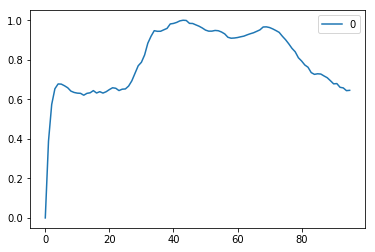

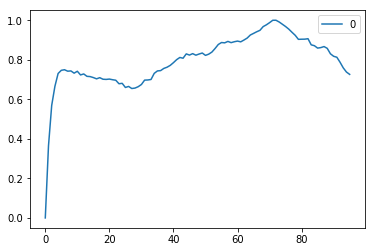

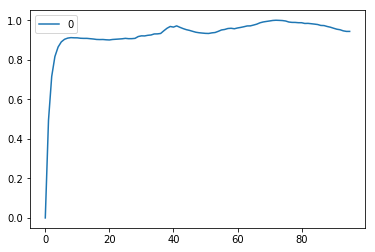

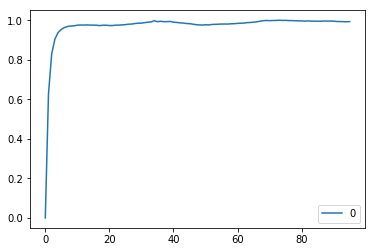

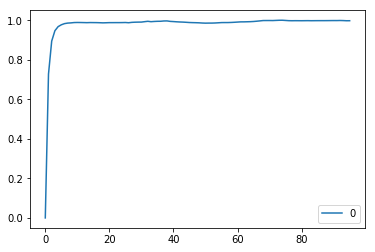

...

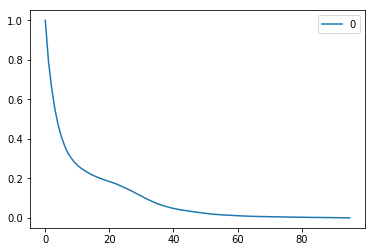

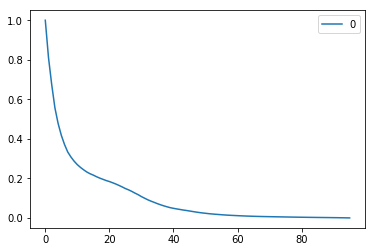

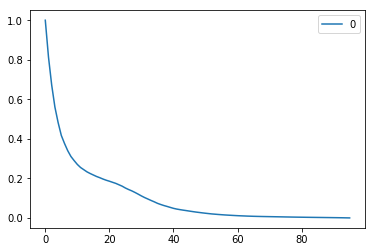

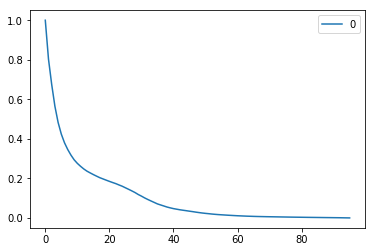

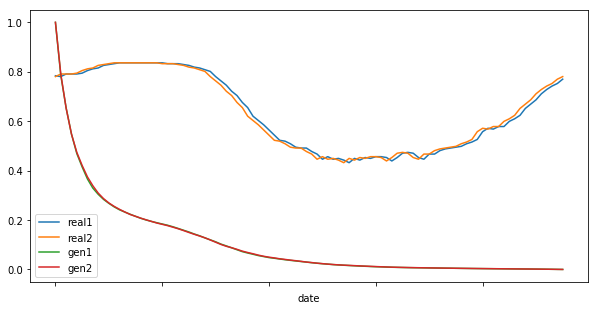

In [7]:
# 用最小二乘法搜索参数
# 将此模型用在交通流数据修复


for lr in [0.0005,0.001]:
    for adm1 in [0.5]: # not sensitive
        for base in [4,8]:
            epochs=50*base
            #for base in range(3, 8):
            for dropout in [0.3, 0.5]:
                for alpha in [0.2, 0.4]:
                    name=str(lr)+'_'+str(adm1)+'_'+str(base)+'_'+str(dropout)+'_'+str(alpha)
                    print(name)
                    train = Train(seqs_normal, adj, node_f, epochs, key=9, 
                                  lr = lr, adam_beta_1 = adm1, base=base, dropout=dropout, alpha=alpha)
                    train(save_path='generated/'+str(epochs)+'/'+name+'_')
                    compare_plot(train, 
                                 str(lr)+'_'+str(adm1)+'_'+str(base)+'_'+str(dropout)+'_'+str(alpha),
                                 save_path='generated/'+str(epochs))

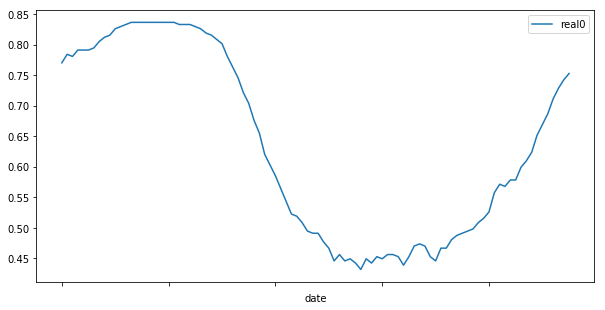

In [24]:
from matplotlib.pyplot import *
fig, ax = subplots()
fig.set_figheight(5)
fig.set_figwidth(10)
n=1
key=9
for w in range(0,n):
    seqs_normal[w*batch_size:w*batch_size+96][key].plot(ax=ax) 
# for w in range(1,n):
#     generated_seq = train.generate()
#     generated_seq.plot(ax=ax)
ax.legend(['real'+str(w) for w in range(0,n)]);# +['gen'+str(w) for w in range(1,n)]);